## **LATAR BELAKANG**
---

Transjakarta merupakan salah satu moda transportasi massal yang paling banyak digunakan oleh masyarakat Jakarta dan sekitarnya. Dengan adanya kemudahan akses dan integrasi dengan moda transportasi lainnya, Transjakarta menjadi pilihan banyak orang untuk beraktivitas sehari-hari. Namun, dengan meningkatnya jumlah pengguna, perlu adanya analisis data untuk memahami perilaku pengguna serta efisiensi layanan.

Transjakarta adalah sebuah sistem transportasi Bus Rapid Transit sejak tahun 2004 di Jakarta, Indonesia. Transjakarta memiliki 260 halte yang tersebar dalam 13 koridor utama dan 10 rute lintas koridor. Kini, Transjakarta terbagi dalam tiga jenis armada, yaitu Regular Transjakarta, Royaltrans, dan Jaklingko . Dalam konteks ini, ingin dicari tahu aspek-aspek yang dapat dijadikan sebuah temuan berdasarkan data transaksi yang dimiliki Transjakarta.

PT.Transjakarta masih dihadapkan oleh beberapa fenomena permasalahan seperti Penumpukan antrian pada koridor dan waktu tertentu. Permasalahan kualitas infrastruktur, yaitu masih banyak warga yang mengeluhkan akses halte yang sulit dan pelayanan serta infrastruktur yang masih kurang memadai.Keluhan akan fasilitas halte yang kurang ramah lingkungan bagi lansia. Permasalahan dalam hal perlindungan wanita akan kejahatan seksual di area operasional Transjakarta 

Oleh karena itu, Transjakarta sebagai salah satu alternatif utama transportasi, berperan penting dalam memenuhi kebutuhan penumpang akan pengalaman bertransportasi yang nyaman. Dalam hal ini optimalisasi kinerja armada dan operasional trayek/halte perjalanan menjadi kunci untuk memberikan pengalaman perjalanan yang nyaman, cepat, dan handal kepada para penumpang.

# Stakeholder

- Management PT. Transjakarta
- Penyedia/Provider Kartu uang Elektronik yang bekerja sama dengan PT. Transjakarta

## **RUMUSAN MASALAH**
---
Bagaimana optimalisasi kinerja armada, fasilitas dan operasional trayek/halte perjalanan Transjakarta.
Salah satu fokus utama adalah meningkatkan efektivitas, efisiensi, dan profitabilitas operasional Transjakarta. Untuk mencapai tujuan ini, akan dijelajahi berbagai aspek yang dapat menjadi temuan, termasuk aspek-aspek berikut:

**Payment** (Pembayaran): Menganalisis data transaksi pembayaran, khususnya dalam hal jenis kartu yang paling sering digunakan oleh pengguna Transjakarta. Ini akan membantu Transjakarta dalam mengoptimalkan strategi pembayaran dan meningkatkan pendapatan.

**Pengguna Transjakarta**: Mengidentifikasi profil pengguna Transjakarta, termasuk data berdasarkan jenis kelamin dan kelompok usia. Informasi ini akan membantu Transjakarta memahami perilaku pengguna dan merancang strategi pemasaran yang lebih efektif serta peningkatan layanan pada armada dan halte.

**Koridor dan Rute Perjalanan**: Analisis koridor yang paling sering digunakan dan pola perjalanan pengguna untuk mengevaluasi kinerja koridor. Dengan pemahaman yang lebih baik tentang preferensi pengguna, *Transjakarta* dapat mengoptimalkan layanan di koridor yang paling diminati.

Dari 3 hal yang disebutkan, diharapkan bisa membantu **stakeholders** terkait yaitu **Divisi Operasional dan Pelayanan & Bisnis Transjakarta** yang juga berkolaborasi dengan **PT JakLingko**.

## **DATA UNDERSTANDING**
---

Untuk menjawab permasalahan diatas, kita akan menganalisis data yang telah tersedia.

In [120]:
# data analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
# warnings.filterwarnings("default")

In [121]:
df = pd.read_csv("Transjakarta.csv")
df.head(3)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,Kemenkes 2,-6.228700,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,Gg. Kunir II,-6.133132,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0


In [122]:
df.columns

Index(['transID', 'payCardID', 'payCardBank', 'payCardName', 'payCardSex',
       'payCardBirthDate', 'corridorID', 'corridorName', 'direction',
       'tapInStops', 'tapInStopsName', 'tapInStopsLat', 'tapInStopsLon',
       'stopStartSeq', 'tapInTime', 'tapOutStops', 'tapOutStopsName',
       'tapOutStopsLat', 'tapOutStopsLon', 'stopEndSeq', 'tapOutTime',
       'payAmount'],
      dtype='object')

Data set berisi 22 kolom yang menjelaskan informasi:
- transID: ID transaksi unik untuk setiap transaksi
- payCardID         : Identifikasi utama pelanggan. Kartu yang pelanggan gunakan sebagai tiket masuk dan keluar.
- payCardBank       : Nama bank penerbit kartu pelanggan
- payCardName       : Nama pelanggan yang tercetak di kartu.
- payCardSex        : Jenis kelamin pelanggan yang tercetak di kartu
- payCardBirthDate  : Tahun kelahiran pelanggan
- corridorID        : ID Koridor / ID Rute sebagai kunci untuk pengelompokan rute.
- corridorName      : Nama Koridor / Nama Rute yang berisi Titik Awal dan Titik Akhir untuk setiap rute.
- direction         : 0 untuk Pergi, 1 untuk Kembali. Arah rute.
- tapInStops        : ID Halte Tap In (masuk) untuk mengidentifikasi nama halte
- tapInStopsName    : Nama Halte Tap In (masuk) di mana pelanggan melakukan tap in.
- tapInStopsLat     : Koordinat latitude halte pengguna tap Masuk
- tapInStopsLon     : Koordinat longitude halte pengguna tap masuk
- stopStartSeq      : Urutan dari halte, halte pertama, halte kedua, dan seterusnya. Terkait dengan arah.
- tapInTime         : Waktu tap in. Tanggal dan waktu
- tapOutStops       : ID Halte Tap Out (keluar) untuk mengidentifikasi nama halte
- tapOutStopsName   : Nama Halte Tap Out (keluar) di mana pelanggan melakukan tap out.
- tapOutStopsLat    : Koordinat latitude halte pengguna tap keluar
- tapOutStopsLon    : Koordinat longitude halte pengguna tap keluar
- stopEndSeq        : Urutan dari halte, halte pertama, halte kedua, dan seterusnya. Terkait dengan arah.
- tapOutTime        : Waktu tap out. Tanggal dan waktu
- payAmount         : Harga yang dibayar oleh pengguna 

Ada 8 kolom tambahan, yaitu:
- transType         : Jenis Transjakarta yang digunakan dalam transaksi
- tapInHour         : Waktu tap masuk pengguna
- tapOutHour        : Waktu tap keluar pengguna
- tapDay            : Hari saat pengguna melakukan tap masuk atau tap keluar
- tripDuration      : Durasi atau lama perjalanan dari titik tap masuk hingga titik tap keluar dalam satuan jam
- tripCategory      : Kategori atau label yang menggambarkan jenis perjalanan
- age               : Usia penumpang Transjakarta
- ageCategory       : Kategori usia penumpang Transjakarta
- ageRange          : Range Usia penumpang Transjakarta


## **DATA CLEANING**
---
Sebelum masuk ke dalam analisis, kita perlu mengenal dataset kita lebih jauh dalam tahapan *data understanding*. Dari proses ini, kita akan tahu anomali-anomali apa saja yang terdapat di dalam dataset kita dan perlu ditangani dalam tahapan *data cleaning*. Setiap penangan anomali yang dilakukan, akan disertai dengan justifikasi langkah yang diambil, baik secara *domain knowledge* maupun secara statistik.

Pertama, mari kita lihat informasi dari RAW dataset.

In [123]:
# Cek Info Data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37900 entries, 0 to 37899
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   transID           37900 non-null  object 
 1   payCardID         37900 non-null  int64  
 2   payCardBank       37900 non-null  object 
 3   payCardName       37900 non-null  object 
 4   payCardSex        37900 non-null  object 
 5   payCardBirthDate  37900 non-null  int64  
 6   corridorID        36643 non-null  object 
 7   corridorName      35970 non-null  object 
 8   direction         37900 non-null  float64
 9   tapInStops        36687 non-null  object 
 10  tapInStopsName    37900 non-null  object 
 11  tapInStopsLat     37900 non-null  float64
 12  tapInStopsLon     37900 non-null  float64
 13  stopStartSeq      37900 non-null  int64  
 14  tapInTime         37900 non-null  object 
 15  tapOutStops       35611 non-null  object 
 16  tapOutStopsName   36556 non-null  object

In [124]:
df.shape

(37900, 22)

In [125]:
df.describe()

,payCardID,payCardBirthDate,direction,tapInStopsLat,tapInStopsLon,stopStartSeq,tapOutStopsLat,tapOutStopsLon,stopEndSeq,payAmount
count,3.790000e+04,37900.000000,37900.000000,37900.000000,37900.000000,37900.000000,36556.000000,36556.000000,36556.000000,36893.000000
mean,4.250060e+17,1990.089314,0.500633,-6.214838,106.841554,13.572480,-6.214651,106.841233,21.219909,2699.712683
std,1.321699e+18,13.051482,0.500006,0.057911,0.060369,12.237623,0.059022,0.060999,13.800689,4212.225592
min,6.040368e+10,1946.000000,0.000000,-6.394973,106.614730,0.000000,-6.394973,106.614730,1.000000,0.000000
25%,1.800442e+14,1982.000000,0.000000,-6.245863,106.803470,4.000000,-6.247225,106.801750,11.000000,0.000000
50%,3.507947e+15,1990.000000,1.000000,-6.214587,106.834830,10.000000,-6.214718,106.834580,18.000000,3500.000000
75%,4.699023e+15,2001.000000,1.000000,-6.175528,106.882270,19.000000,-6.174736,106.883030,29.000000,3500.000000
max,4.997694e+18,2012.000000,1.000000,-6.089429,107.023950,68.000000,-6.091746,107.023660,77.000000,20000.000000


In [126]:
df.describe(include='object')

,transID,payCardBank,payCardName,payCardSex,corridorID,corridorName,tapInStops,tapInStopsName,tapInTime,tapOutStops,tapOutStopsName,tapOutTime
count,37900,37900,37900,37900,36643,35970,36687,37900,37900,35611,36556,36556
unique,37900,6,1993,2,221,216,2570,2602,37079,2230,2248,35908
top,EIIW227B8L34VB,dki,Fathonah Saefullah,F,1T,Cibubur - Balai Kota,P00170,Penjaringan,2023-04-25 06:23:00,P00016,BKN,2023-04-10 19:10:15
freq,1,18743,80,20157,400,391,236,243,3,306,316,3


**UNIQUE**

In [127]:
listItem = []
for col in df.columns :
 
    listItem.append( [col, df[col].nunique(), df[col].unique()   ])

unique_values = pd.DataFrame(columns=['Column Name', 'Number of Unique', 'Unique Sample'],
                     data=listItem)
unique_values

,Column Name,Number of Unique,Unique Sample
0,transID,37900,"[EIIW227B8L34VB, LGXO740D2N47GZ, DJWR385V2U57T..."
1,payCardID,2000,"[180062659848800, 4885331907664776, 4996225095..."
2,payCardBank,6,"[emoney, dki, flazz, online, brizzi, bni]"
3,payCardName,1993,"[Bajragin Usada, Gandi Widodo, Emong Wastuti, ..."
4,payCardSex,2,"[M, F]"
5,payCardBirthDate,67,"[2008, 1997, 1992, 1978, 1982, 1993, 1974, 199..."
6,corridorID,221,"[5, 6C, R1A, 11D, 12, 1T, JAK.18, nan, B14, 1Q..."
7,corridorName,216,"[Matraman Baru - Ancol, Stasiun Tebet - Karet ..."
8,direction,2,"[1.0, 0.0]"
9,tapInStops,2570,"[P00142, B01963P, B00499P, B05587P, P00239, B0..."


Secara umum, kita bisa melihat bahwa:
* dataset transjakarta memiliki 22 kolom dan 37.900 baris
* data set berasal dari periode 1 april 2023 sampai dengan 30 april 2023.
* beberapa kolom, memiliki data kosong. Data kosong pada kolom-kolom tersebut diwakili dengan data NaN, dan akan di handling.
* kita juga dapat melihat tipe data pada masing-masing kolom yang mana, pada kolom tapInTime dan tapOutTime tipe data masih berbentuk object dan perlu di ubah ke tipe data time. untuk selebihnya tipe data sudah sesuai.
* berdasarkan data set, data analisis akan banyak menggunakan data berjenis kategorikal.
* dari table Unique, kita dapat melihat distinct/ kategori/ nilai unik dari masing-masing variable. Dari unik data yang ada, dapat dilihat bahwa masih ada ketidaksesuaian jumlah unik antara corridorID dan CorridorName yang seharusnya memiliki jumlah Nunique yang sama. oleh karena dihandling. 

**CEK DUPLIKAT**

In [128]:
# Cek Duplikat
len(df[df.duplicated()])

0

In [129]:
# menghitung jumlah data unik dalam Coridor Name

duplicate_corridor = df.groupby('corridorName')['corridorID'].nunique()
duplicate_corridor

corridorName
Andara - Stasiun Universitas Pancasila        1
BKN - Blok M                                  1
BSD - Jelambar                                1
BSD Serpong - Fatmawati                       1
Batusari - Grogol                             1
                                             ..
Terminal Rawamangun - Cipinang Muara          1
Terminal Tanah Merah - Pulo Gadung            1
Terminal Tanjung Priok - Ancol Barat          1
Tongtek - Tebet Eco Park (TEP) - Cililitan    1
Universitas Indonesia - Lebak Bulus           1
Name: corridorID, Length: 216, dtype: int64

In [130]:
# Mengecek apakah ada 1 koridor yang sama memiliki corridorID yang berbeda
corridors_id_sama = duplicate_corridor[duplicate_corridor > 1]
corridors_id_sama

corridorName
Blok M - Kota                          2
Kalideres - Bundaran HI via Veteran    2
Matraman Baru - Ancol                  2
Pinang Ranti - Pluit                   2
Pulo Gadung - Monas                    2
Name: corridorID, dtype: int64

In [131]:
result_df = pd.DataFrame({'corridorName': corridors_id_sama.index,
                          'uniqueCorridorID': corridors_id_sama.values})

In [132]:
corridor_ids = []
for corridor_name in result_df['corridorName']:
    unique_ids = df[df['corridorName'] == corridor_name]['corridorID'].unique()
    corridor_ids.append(unique_ids)
result_df['corridorID'] = corridor_ids
result_df

,corridorName,uniqueCorridorID,corridorID
0,Blok M - Kota,2,"[M1, 1]"
1,Kalideres - Bundaran HI via Veteran,2,"[M3, 3, nan]"
2,Matraman Baru - Ancol,2,"[5, nan, M5]"
3,Pinang Ranti - Pluit,2,"[M9, 9, nan]"
4,Pulo Gadung - Monas,2,"[2, M2, nan]"


In [133]:
df.loc[(df['corridorName'] == 'Blok M - Kota') & (df['corridorID'] == 'M1'), 'corridorName'] = 'Blok M - Kota(M)'
df.loc[(df['corridorName'] == 'Kalideres - Bundaran HI via Veteran') & (df['corridorID'] == 'M3'), 'corridorName'] = 'Kalideres - Bundaran HI via Veteran(M)'
df.loc[(df['corridorName'] == 'Matraman Baru - Ancol') & (df['corridorID'] == 'M5'), 'corridorName'] = 'Matraman Baru - Ancol(M)'
df.loc[(df['corridorName'] == 'Pinang Ranti - Pluit') & (df['corridorID'] == 'M9'), 'corridorName'] = 'Pinang Ranti - Pluit(M)'
df.loc[(df['corridorName'] == 'Pulo Gadung - Monas') & (df['corridorID'] == 'M2'), 'corridorName'] = 'Pulo Gadung - Monas(M)'


setelah dilakukan pengecekan data duplikated, diketahui bahwa ada 1 nama koridor yang memiliki 2 unik corridorID yang berbeda. hal tersebut terjadi karena koridor yang sama dibedakan berdasarkan jam operasionalnya. oleh karena itu untuk menghindari kebingungan pembacaan, koridor yang sama tersebut diberikan kode tambahan (M) untuk jam operasional malam hari.

**Cek Missing Value**

In [134]:
# Cek Missing Value
df.isna().sum()


transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID          1257
corridorName        1930
direction              0
tapInStops          1213
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         2289
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount           1007
dtype: int64

missing value banyak ditemukan. Oleh karena itu missing value tersebut akan diisi oleh masing-masing nilai yang paling mewakilkan data pada kolom tersebut.

Dari hasil pengecekan missing value dibawah,
* Missing value ditemukan pada sekitar 6% data
* Ada 10 kolom yang terdapat *missing value*, Missing value banyak ditemukan pada kolom `corridorID`, `corridorName`, `tapInStops`, `tapOutStops`, `tapOutStopsName`, `tapOutStopsLat`,`tapOutStopsLon`,`stopEndSeq`,`tapOutTime`, dan ` payAmount `

In [135]:
df.isna().sum()/df.shape[0]*100


transID             0.000000
payCardID           0.000000
payCardBank         0.000000
payCardName         0.000000
payCardSex          0.000000
payCardBirthDate    0.000000
corridorID          3.316623
corridorName        5.092348
direction           0.000000
tapInStops          3.200528
tapInStopsName      0.000000
tapInStopsLat       0.000000
tapInStopsLon       0.000000
stopStartSeq        0.000000
tapInTime           0.000000
tapOutStops         6.039578
tapOutStopsName     3.546174
tapOutStopsLat      3.546174
tapOutStopsLon      3.546174
stopEndSeq          3.546174
tapOutTime          3.546174
payAmount           2.656992
dtype: float64

In [136]:
missing_values = df.isnull().sum()

# cek persentase missing values
missing_percentage = (df.isnull().sum() / len(df)) * 100

missing_info = pd.DataFrame({'Missing Values': missing_values, 'Percentage (%)': missing_percentage}).sort_values(by='Percentage (%)', ascending=False)
missing_info[missing_info['Missing Values'] > 0]


,Missing Values,Percentage (%)
tapOutStops,2289,6.039578
corridorName,1930,5.092348
tapOutTime,1344,3.546174
stopEndSeq,1344,3.546174
tapOutStopsLon,1344,3.546174
tapOutStopsLat,1344,3.546174
tapOutStopsName,1344,3.546174
corridorID,1257,3.316623
tapInStops,1213,3.200528
payAmount,1007,2.656992


**Mengisi Missing Value**

dalam data ini, digunakan 2 cara untuk menangani *missing value*:
* pertama mengisi data yang hilang. Pengisian missing value pada setiap kolom memiliki cara yang berbeda bergantung pada kesesuaian pengisian nilai yang paling mendekati dan rasional. adapun masing-masing pengisiannya dapat dilihat pada bagian dibawah ini.
* kedua menghapus baris sisa yang memang tidak bisa diisi missing valuenya.

dalam kasus data ini, pengisian missing value banyak menggunakan kolom lain yang berhubungan melalui metode mapping, oleh karena itu, dalam proses pengisian akan dibuat rules bahwa kolom dapat dilakukan pengisian dengan mapping apabila kolom yang dibenchmark tidak kosong. jika kosong, kemungkinan akan diisi dengan mapping berdasarkan kolom lain atau akan di drop

**Missing Value Corridor ID**

missing value pada kolom corridorID yaitu sebesar 3,3% data. adapun missing value tersebut di isi berdasarkan mapping corridorName dan juga mapping lokasi halte berupa latitude dan longitude.
- Mengapa mengisi menggunakan mapping dengan corridorName? adalah karena keduanya saling mewakilkan. satu corridorName akan memiliki satu corridorID.
- Mengapa mengisi menggunakan mapping dengan latitude dan longitude? karena titik lokasi tersebut dapat menjelaskan dimana lokasi koridor berada.

**a. Missing Value Corridor ID Menggunakan mapping corridor name**

In [137]:
corridor_id = df.dropna(subset=['corridorID']).drop_duplicates('corridorName')
corridor_id= corridor_id.set_index('corridorName')['corridorID']
corridor_id

corridorName
Matraman Baru - Ancol                                  5
Stasiun Tebet - Karet via Patra Kuningan              6C
Pantai Maju - Kota                                   R1A
Pulo Gebang - Pulo Gadung 2 via PIK                  11D
Tanjung Priok - Pluit                                 12
                                                   ...  
Senen - Tanah Abang                                   1R
Kampung Rambutan - Blok M                             7B
Matraman Baru - Ancol(M)                              M5
Term. Pulo Gadung - Lampiri                       JAK.99
Tanah Abang - Kebayoran Lama via Pos Pengumben    JAK.12
Name: corridorID, Length: 222, dtype: object

In [138]:
def fill_missing_corridor_id(row):
    if pd.isnull(row['corridorID']) and pd.notnull(row['corridorName']):
        return corridor_id.get(row['corridorName'])
    return row['corridorID']

In [139]:
df['corridorID'] = df.apply(fill_missing_corridor_id, axis=1)

**b. Missing Value Corridor ID menggunakan tapInStopsLat dan tapInStopLon**

In [140]:
corridor_id_1 = df.dropna(subset=['corridorID']).drop_duplicates(['tapInStopsLat', 'tapInStopsLon'])
corridor_id_1 = corridor_id_1.set_index(['tapInStopsLat', 'tapInStopsLon'])['corridorID']

In [141]:
def fill_missing_corridor_id1(row):
    if pd.isnull(row['corridorID']) and pd.notnull(row['tapInStopsLat']) and pd.notnull(row['tapInStopsLon']):
        return corridor_id_1.get((row['tapInStopsLat'], row['tapInStopsLon']))
    return row['corridorID']

In [142]:
df['corridorID'] = df.apply(fill_missing_corridor_id1, axis=1)

**Missing Value Corridor Name**

- missing value pada kolom corridorName adalah sekitar 5% dari data. nilai yang kosong tersebut diisi berdasarkan mapping dengan corridorID karena keduanya bisa saling mengisi.
- mengapa diisi menggunakan mapping dengan corridorID? karena sama halnya corridorID keduanya saling mewakilkan. satu corridorName akan memiliki satu corridorID.

In [143]:
corridor_name = df.dropna(subset=['corridorName']).drop_duplicates('corridorID')
corridor_name = corridor_name.set_index('corridorID')['corridorName']

In [144]:
def fill_missing_corridor_name(row):
    if pd.isnull(row['corridorName']) and pd.notnull(row['corridorID']):
        return corridor_name.get(row['corridorID'])
    return row['corridorName']

In [145]:
df['corridorName'] = df.apply(fill_missing_corridor_name, axis=1)

**Missing Value tapInStops**

- Missing Value pada kolom tapInStops atau ID halte titik awal diisi berdasarkan mapping dari lokasi halte tersebut berdasarkan latitude dan longitude. Hal ini dilakukan karena latitude dan longitude pada halte tap in dapat merepresentasikan lokasi tapInStop, dan satu latitude dan longitude dapat digunakan untuk menentukan satu nama dan lokasi tap in stops itu sendiri. 

In [146]:
tap_in_stops_mapping = df.dropna(subset=['tapInStops']).drop_duplicates(['tapInStopsLon', 'tapInStopsLat'])
tap_in_stops_mapping = tap_in_stops_mapping.set_index(['tapInStopsLon', 'tapInStopsLat'])['tapInStops']

In [147]:
def fill_missing_tapInStops(row):
    if pd.isnull(row['tapInStops']) and pd.notnull(row['tapInStopsLon']) and pd.notnull(row['tapInStopsLat']):
        return tap_in_stops_mapping.get((row['tapInStopsLon'], row['tapInStopsLat']))
    return row['tapInStops']

In [148]:
df['tapInStops'] = df.apply(fill_missing_tapInStops, axis=1)

**Missing Value tapOutStops**

- Missing Value pada kolom tapInStops atau ID halte titik awal memiliki proporsi yang mendominasi yaitu sebesar 6% data.  nilai kosong pada kolom ini diisi berdasarkan mapping dari lokasi halte tersebut berdasarkan latitude dan longitude.
- Hal ini dilakukan karena latitude dan longitude pada halte tap out dapat merepresentasikan lokasi tapIOuttop, dan satu latitude dan longitude dapat digunakan untuk menentukan satu nama dan lokasi tap out stops itu sendiri. 

In [149]:
tap_out_stops = df.dropna(subset=['tapOutStops']).drop_duplicates(['tapOutStopsLon', 'tapOutStopsLat'])
tap_out_stops = tap_out_stops.set_index(['tapOutStopsLon', 'tapOutStopsLat'])['tapOutStops']

In [150]:
def fill_missing_tapOutStops(row):
    if pd.isnull(row['tapOutStops']) and pd.notnull(row['tapOutStopsLon']) and pd.notnull(row['tapOutStopsLat']):
        return tap_out_stops.get((row['tapOutStopsLon'], row['tapOutStopsLat']))
    return row['tapOutStops']

In [151]:
df['tapOutStops'] = df.apply(fill_missing_tapOutStops, axis=1)

**Missing Value tapOutStopsName**

Missing value tapOutStopsName atau nama halte tap out diisi berdasarkan mapping dengan ID tapInStops, karena keduanya bisa saling mewakilkan.

In [152]:
tap_out_stops_name = df.dropna(subset=['tapOutStopsName']).drop_duplicates('tapOutStops')
tap_out_stops_name = tap_out_stops_name.set_index('tapOutStops')['tapOutStopsName']

In [153]:
def fill_missing_tapOutStopsName(row):
    if pd.isnull(row['tapOutStopsName']) and pd.notnull(row['tapOutStops']):
        return tap_out_stops_name.get(row['tapOutStops'])
    return row['tapOutStopsName']

In [154]:
df['tapOutStopsName'] = df.apply(fill_missing_tapOutStopsName, axis=1)

**Missing Value tapOutStopsLat**

- Missing value tapOutStopsLat atau latitude halte tapOut diisi berdasarkan mapping dengan ID tapInStops nya. 
- hal ini dilakukan dengan alasan yang sama dalam mengisi tapOuStop, yaitu karena latitude dan longitude pada halte tap out dapat saling merepresentasikan lokasi tapOuStop, dan satu latitude dan longitude dapat digunakan untuk menentukan satu nama dan lokasi tap out stops itu sendiri.

In [155]:
tap_out_stops_lat= df.dropna(subset=['tapOutStopsLat']).drop_duplicates('tapOutStops')
tap_out_stops_lat = tap_out_stops_lat.set_index('tapOutStops')['tapOutStopsLat']

In [156]:
def fill_missing_tapOutStopsLat(row):
    if pd.isnull(row['tapOutStopsLat']) and pd.notnull(row['tapOutStops']):
        return tap_out_stops_lat.get(row['tapOutStops'])
    return row['tapOutStopsLat']

In [157]:
df['tapOutStopsLat'] = df.apply(fill_missing_tapOutStopsLat, axis=1)

**Missing Value tapOutStopsLon**
- Missing value tapOutStopsLon atau longitud halte tapout diisi berdasarkan mapping dengan ID tapInStops nya
- hal ini dilakukan dengan alasan yang sama dalam mengisi tapOuStop, yaitu karena latitude dan longitude pada halte tap out dapat saling merepresentasikan lokasi tapOuStop, dan satu latitude dan longitude dapat digunakan untuk menentukan satu nama dan lokasi tap out stops itu sendiri.

In [158]:
tap_out_stops_lon = df.dropna(subset=['tapOutStopsLon']).drop_duplicates('tapOutStops')
tap_out_stops_lon = tap_out_stops_lon.set_index('tapOutStops')['tapOutStopsLon']

In [159]:
def fill_missing_tapOutStopsLon(row):
    if pd.isnull(row['tapOutStopsLon']) and pd.notnull(row['tapOutStops']):
        return tap_out_stops_lon.get(row['tapOutStops'])
    return row['tapOutStopsLon']

In [160]:
df['tapOutStopsLon'] = df.apply(fill_missing_tapOutStopsLon, axis=1)

**Missing Value payAmount**
* Pay Amount/ tarif transjakarta memiliki nilai flat yaitu, Rp.3500 (Regular Transjakarta). namun untuk Royal Trans atau koridor yang melayani perjalanan lintas jabodetabek (khusus), dikenakan tarif sebesar Rp.20.000. ada pun tarif gratis Rp.0 diberikan pada tempat atau halte-halte tertentu dan pada kondisi tertentu (JakLingko).
* missing value pada kolom ini dibagi berdasarkan 3, yaitu jika korido melayani lintas jabodetabek, maka akan diisi dengan pay Amount Rp.20.000, untuk kemudian koridor Regular flat sebesar Rp.3500. dan JankLingko Rp.0

In [161]:
# Mengisi Missing Value di 'payAmount' berdasarkan 'corridorID'
df.loc[df['corridorID'] == 'JAK', 'payAmount'].fillna(0, inplace=True)

In [162]:
payAmount_by_CorridorID = pd.crosstab(df['corridorID'], df['payAmount'])
payAmount_by_CorridorID

payAmount,0.0,3500.0,20000.0
corridorID,,,
1,0,250,0
10,0,111,0
10A,151,1,0
10B,143,0,0
10D,0,172,0
...,...,...,...
S21,0,395,0
S22,0,140,0
S31,0,0,152


Disini menggunakan crosstab untuk melihat data yang terdapat di kolom corridorID. Selanjutnya, akan diisi missing value di payAmount berdasarkan corridorID.

1. berdasarkan data dari https://money.kompas.com/read/2023/03/13/140000226/naik-angkot-jaklingko-masih-gratis- pada bulan maret 2023. biaya yang diperlukan untuk angkutan umum yang berjenis Jaklingko adalah Rp 0. 
2. berdasarkan data dari informasi biaya yang diperlukan untuk angkutan umum yang berjenis bus TransJakarta adalah Rp. 3.500 https://transjakarta.co.id/produk-dan-layanan/info-tiket/
3. berdasarkan data dari sumber dibawah ini.
    1. https://transjakarta.co.id/produk-dan-layanan/layanan-bus/royaltrans/
    2. https://megapolitan.kompas.com/read/2023/08/27/01000061/tarif-royaltrans-dan-rutenya-2023
    
  

kita perlu menyesuaikan data cleaning untuk kolom payAmount sesuai dengan informasi tersebut.

Mari kita lakukan penyesuaian pada proses data cleaning untuk kolom payAmount dengan memastikan bahwa setiap entri untuk koridor dengan ID 1T, B14, D32, S31, B13, D31, 1K, 6P dan S12 adalah Royaltrans. tarif Royaltrans adalah Rp 20.000, selanjutnya koridor dengan awalan "JAK" memiliki biaya Rp 0  dan selain dari JAK adalah Rp 3500.

In [163]:
def fill_pay_amount(row):
    if row['corridorID'] in ['1K', '1T', '6P', 'B13', 'B14', 'D31', 'D32', 'S12', 'S31', 'T21']:
        return 20000
    elif row['corridorID'] in ['10A', '10B', '11B', '11C', '11K', '11M', '11N', '11P', '12C', '12F', '2E', '2F', '2H', '3A', '3B', '3C', '4E', '9F', 'BW9', 'JAK']:
        return 0
    else:
        return 3500

# Mengisi nilai
df['payAmount'] = df.apply(lambda row: fill_pay_amount(row) if pd.isna(row['payAmount']) else row['payAmount'], axis=1)

In [164]:
df.isna().sum()

transID                0
payCardID              0
payCardBank            0
payCardName            0
payCardSex             0
payCardBirthDate       0
corridorID            33
corridorName          33
direction              0
tapInStops            34
tapInStopsName         0
tapInStopsLat          0
tapInStopsLon          0
stopStartSeq           0
tapInTime              0
tapOutStops         1363
tapOutStopsName     1344
tapOutStopsLat      1344
tapOutStopsLon      1344
stopEndSeq          1344
tapOutTime          1344
payAmount              0
dtype: int64

**Drop Baris yang memiliki Missing Value dan tidak dapat diisi**

In [165]:
# Menghapus sisa yang terdapat Missing Value
df.dropna(subset=['corridorID', 'corridorName', 'tapInStops', 'tapOutStops', 'tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon', 'stopEndSeq', 'tapOutTime'], inplace=True)

In [166]:
df.isna().sum()

transID             0
payCardID           0
payCardBank         0
payCardName         0
payCardSex          0
payCardBirthDate    0
corridorID          0
corridorName        0
direction           0
tapInStops          0
tapInStopsName      0
tapInStopsLat       0
tapInStopsLon       0
stopStartSeq        0
tapInTime           0
tapOutStops         0
tapOutStopsName     0
tapOutStopsLat      0
tapOutStopsLon      0
stopEndSeq          0
tapOutTime          0
payAmount           0
dtype: int64

Data sudah tidak memiliki missing value

## **DATA PREPARATION**
---

In [167]:
# Cek Tipe Data
df.dtypes

transID              object
payCardID             int64
payCardBank          object
payCardName          object
payCardSex           object
payCardBirthDate      int64
corridorID           object
corridorName         object
direction           float64
tapInStops           object
tapInStopsName       object
tapInStopsLat       float64
tapInStopsLon       float64
stopStartSeq          int64
tapInTime            object
tapOutStops          object
tapOutStopsName      object
tapOutStopsLat      float64
tapOutStopsLon      float64
stopEndSeq          float64
tapOutTime           object
payAmount           float64
dtype: object

In [168]:
# Mengubah data type payAmount menjadi Integer
df['payAmount'] = df['payAmount'].astype('int64')

In [169]:
# Membuat kolom baru untuk jenis Transjakarta yang digunakan
def trans_type(payAmount):
    if payAmount == 20000:
        return 'RoyalTrans'
    elif payAmount == 3500:
        return 'Regular Transjakarta'
    else:
        return 'JakLingko'

df['transType'] = df['payAmount'].apply(trans_type)

df.head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,transType
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500,Regular Transjakarta
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,Kemenkes 2,-6.228700,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500,Regular Transjakarta
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,Gg. Kunir II,-6.133132,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500,Regular Transjakarta
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,Taman Elok 1,-6.195743,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500,Regular Transjakarta
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,Sunter Boulevard Barat,-6.149650,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500,Regular Transjakarta


**MODIFIKASI WAKTU**

In [170]:
# Mengubah Tipe Data untuk Tap In dan Tap Out time, lalu membuat kolom tap in&out Hour dan juga Day
df['tapInTime'] = pd.to_datetime(df['tapInTime'])
df['tapOutTime'] = pd.to_datetime(df['tapOutTime'])
df['tapInHour'] = df['tapInTime'].dt.hour
df['tapOutHour'] = df['tapOutTime'].dt.hour
df['tapDay'] = df['tapInTime'].dt.dayofweek

In [171]:
df['tapInDay'] = df['tapInTime'].dt.dayofweek

In [172]:
tapInDay = {
    0: 'Monday',
    1: 'Tuesday',
    2: 'Wednesday',
    3: 'Thursday',
    4: 'Friday',
    5: 'Saturday',
    6: 'Sunday'
}
df['tapInDay'] = df['tapInDay'].map(tapInDay)

In [173]:
df["tapInWeek"] =df['tapOutTime'].dt.strftime('%d')

**Membuat Kolom Age, Age Category dan Age Range**

In [174]:
# Membuat kolom umur pengguna dg asumsi tahun terakhir adalah tahun 2023
df['age'] = 2023 - df['payCardBirthDate']
df.head(1)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,transType,tapInHour,tapOutHour,tapDay,tapInDay,tapInWeek,age
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500,Regular Transjakarta,5,6,0,Monday,03,15


In [175]:
# membuat kolom 'ageCategory'
def age_category(age):
    if age < 12:
        return 'Anak-anak'
    elif 12 <= age <= 17:
        return 'Remaja'
    elif 18 <= age <= 60:
        return 'Dewasa'
    else:
        return 'Lansia'


# Menerapkan fungsi untuk membuat kolom 'ageCategory'
df['ageCategory'] = df['age'].apply(age_category)
df.head(1)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,transType,tapInHour,tapOutHour,tapDay,tapInDay,tapInWeek,age,ageCategory
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500,Regular Transjakarta,5,6,0,Monday,03,15,Remaja


In [176]:
# Membuat kolom Age Range
def age_range(age):
    if age < 12:
        return 'Under 12'
    elif 12 <= age <= 17:
        return '12-17'
    elif 18 <= age <= 20:
        return '18-20'
    elif 21 <= age <= 30:
        return '21-30'
    elif 31 <= age <= 40:
        return '31-40'
    elif 41 <= age <= 50:
        return '41-50'
    elif 51 <= age <= 60:
        return '51-60'
    else:
        return 'Lansia'

# Menerapkan fungsi untuk membuat kolom 'ageGroup'
df['ageRange'] = df['age'].apply(age_range)
df.head(1)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,transType,tapInHour,tapOutHour,tapDay,tapInDay,tapInWeek,age,ageCategory,ageRange
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500,Regular Transjakarta,5,6,0,Monday,03,15,Remaja,12-17


Sebelum memulai analisis, kita harus melihat sebaran data atau outliers yang terdapat dalam data. Bertujuan mengetahui apakah data terdistribusi normal atau tidak.

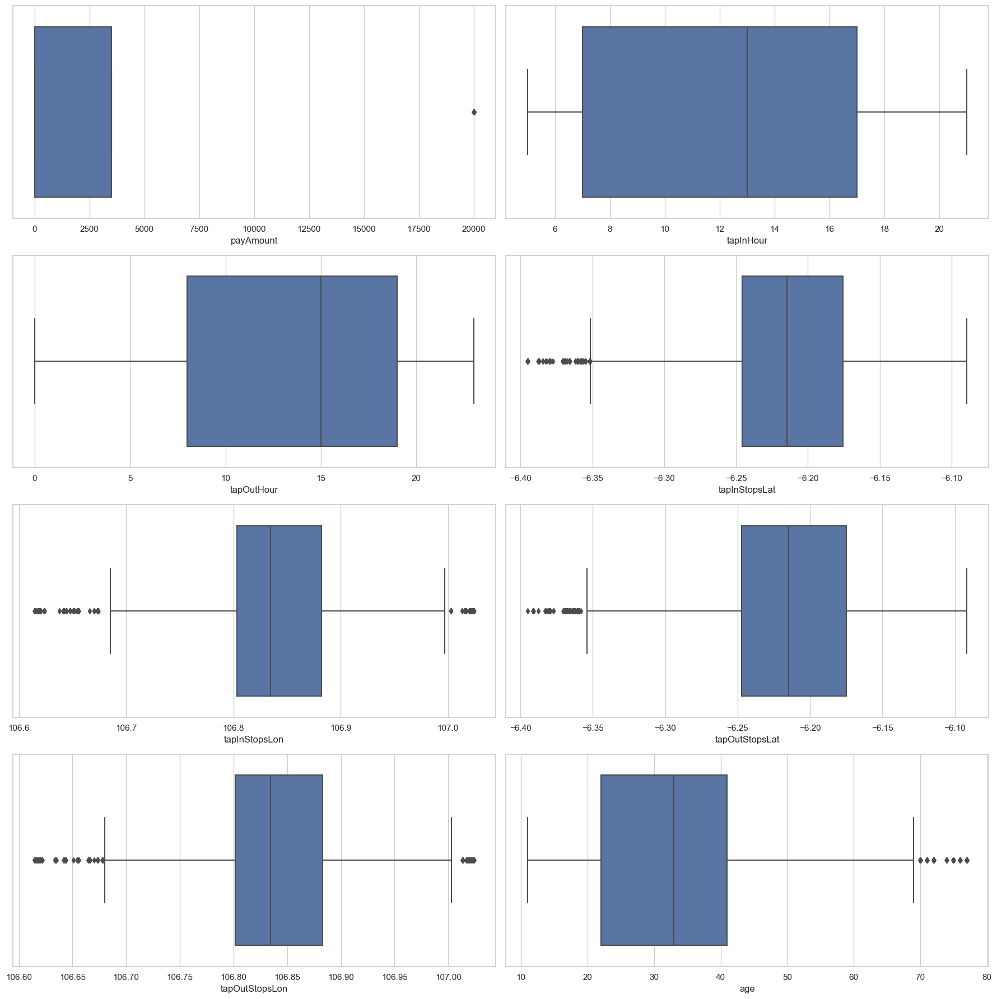

In [177]:
fig, axes = plt.subplots(nrows = 4, ncols = 2, figsize=(18,18))


sns.boxplot(data=df, x='payAmount', ax=axes[0][0])
sns.boxplot(data=df, x='tapInHour', ax=axes[0][1])
sns.boxplot(data=df, x='tapOutHour', ax=axes[1][0])
sns.boxplot(data=df, x='tapInStopsLat', ax=axes[1][1])
sns.boxplot(data=df, x='tapInStopsLon', ax=axes[2][0])
sns.boxplot(data=df, x='tapOutStopsLat', ax=axes[2][1])
sns.boxplot(data=df, x='tapOutStopsLon', ax=axes[3][0])
sns.boxplot(data=df, x='age', ax=axes[3][1])


fig.tight_layout()

plt.show()

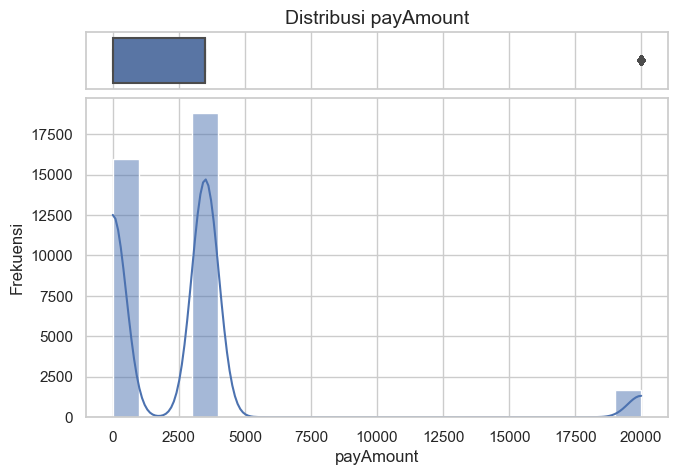

In [178]:
fig, (ax1, ax2) = plt.subplots(2, sharex = True, figsize = (7.5,5), 
                                   gridspec_kw={"height_ratios": (.15, .85),
                                               "hspace": 0.05})

ax1.set_title(f"Distribusi payAmount", size = 14)
sns.boxplot(x = df['payAmount'], ax = ax1)
ax1.set(xlabel = "")

sns.histplot(data = df['payAmount'], ax = ax2, kde=True, bins=20)
plt.ylabel('Frekuensi')
plt.show()

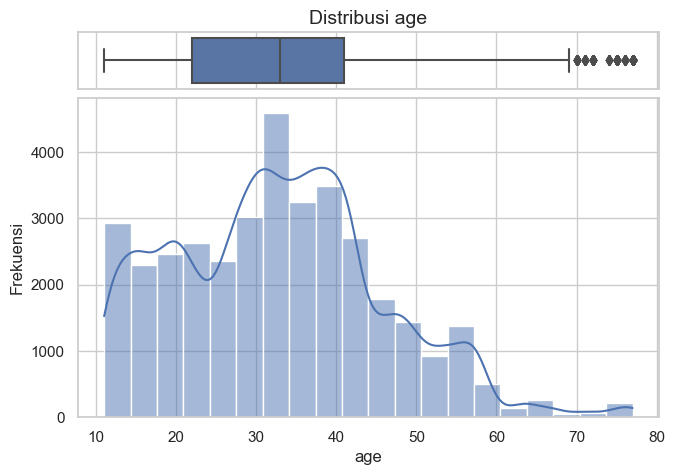

In [179]:
fig, (ax1, ax2) = plt.subplots(2, sharex = True, figsize = (7.5,5), 
                                   gridspec_kw={"height_ratios": (.15, .85),
                                               "hspace": 0.05})

ax1.set_title(f"Distribusi age", size = 14)
sns.boxplot(x = df['age'], ax = ax1)
ax1.set(xlabel = "")

sns.histplot(data = df['age'], ax = ax2, kde=True, bins=20)
plt.ylabel('Frekuensi')
plt.show()

Lalu melakukan uji normalitas dengan menggunakan Kolmogorov-Smirnov Test untuk menguji lebih detail apakah data terdistribusi normal atau tidak.

In [180]:
# Uji Normalitas
from scipy.stats import kstest

kolom_uji = ['payCardBirthDate','stopStartSeq','stopEndSeq','payAmount','tapInHour','tapOutHour','age']

list = []

for i in kolom_uji : 
    ks,pvalue = kstest((df[i]), 'norm')
    if pvalue> 0.05:
        list.append([i,round(pvalue,2), ' distribusi normal'])
    else :
        list.append([i,round(pvalue,2), 'distribusi tidak normal'])

print('Jika p-value < 0,05 maka data terdistribusi tidak normal')
print('Jika p-value > 0,05 maka data terdistribusi normal')
print(f'\n')
print('Hasil Uji Normalitas')
pd.DataFrame(list, columns =[['Nama kolom','p-value','Distribusi']])

Jika p-value < 0,05 maka data terdistribusi tidak normal
Jika p-value > 0,05 maka data terdistribusi normal


Hasil Uji Normalitas


,Nama kolom,p-value,Distribusi
0,payCardBirthDate,0.0,distribusi tidak normal
1,stopStartSeq,0.0,distribusi tidak normal
2,stopEndSeq,0.0,distribusi tidak normal
3,payAmount,0.0,distribusi tidak normal
4,tapInHour,0.0,distribusi tidak normal
5,tapOutHour,0.0,distribusi tidak normal
6,age,0.0,distribusi tidak normal


Kolom yang dilihat yaitu kolom-kolom yang berisikan nilai numerikal. Berdasarkan temuan diatas yang berupa boxplot dan uji normalitas Kolmogorov-Smirnov Test, disimpulkan bahwa data tidak terdistribusi normal

export data yang sudah clean ke Excel.

In [181]:
# Export data clean ke excel
df.to_csv('Transjakarta_clean.csv', index=False)

In [182]:
# Melihat Dataset yang Sudah Clean
pd.set_option('display.max_columns', None)
df.head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,transType,tapInHour,tapOutHour,tapDay,tapInDay,tapInWeek,age,ageCategory,ageRange
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,Pal Putih,-6.184631,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500,Regular Transjakarta,5,6,0,Monday,03,15,Remaja,12-17
1,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,Kemenkes 2,-6.228700,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500,Regular Transjakarta,5,6,0,Monday,03,26,Dewasa,21-30
2,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,Gg. Kunir II,-6.133132,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500,Regular Transjakarta,5,6,0,Monday,03,31,Dewasa,31-40
3,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,Taman Elok 1,-6.195743,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500,Regular Transjakarta,5,6,0,Monday,03,45,Dewasa,41-50
4,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,Sunter Boulevard Barat,-6.149650,106.88900,5,2023-04-03 06:17:35,P00098,Kali Besar Barat,-6.135355,106.81143,15.0,2023-04-03 06:57:03,3500,Regular Transjakarta,6,6,0,Monday,03,41,Dewasa,41-50


## **Exploratory Data Analysis (EDA)**
----

## **Berdasarkan Karakteristik Perilaku Pengguna**

Pertama, mari kita lihat bagaimana karakteristik perilaku pengguna Transjakarta. Kita analisa kolom  payCardBank, payCardSex, age, ageCategory, dan ageRange untuk menjawab beberapa pertanyaan.

* Bank apa yang paling banyak digunakan?
* kelompok jenis kelamin yang paling tinggi dalam menggunakan Transjakarta?
* kelompok umur yang paling tinggi dalam menggunakan Transjakarta?

**Distribusi Kartu Bank yang digunakan Penumpang Transjakarta**

In [183]:
# Mengetahui Jenis Kartu Yang Digunakan Untuk Pembayaran Transjakarta
payments = df['payCardBank'].value_counts().reset_index()
payments.columns = ['payCardBank', 'count']
payments

,payCardBank,count
0,dki,18015
1,emoney,6625
2,brizzi,3390
3,flazz,3101
4,online,2765
5,bni,2578


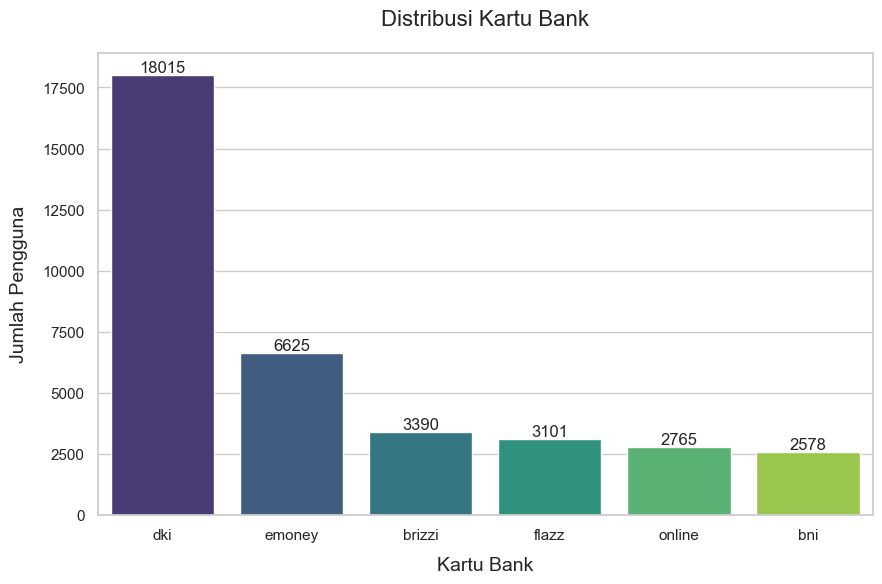

In [184]:
# Membuat Grafik Barplot untuk distribusi Kartu Bank

plt.figure(figsize=(10,6))
plot = sns.barplot(data=payments, y='count', x='payCardBank', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('Distribusi Kartu Bank', size=16, pad=20)
plt.xlabel('Kartu Bank', size =14, labelpad = 10)
plt.ylabel('Jumlah Pengguna', size =14, labelpad = 10)
plt.show()

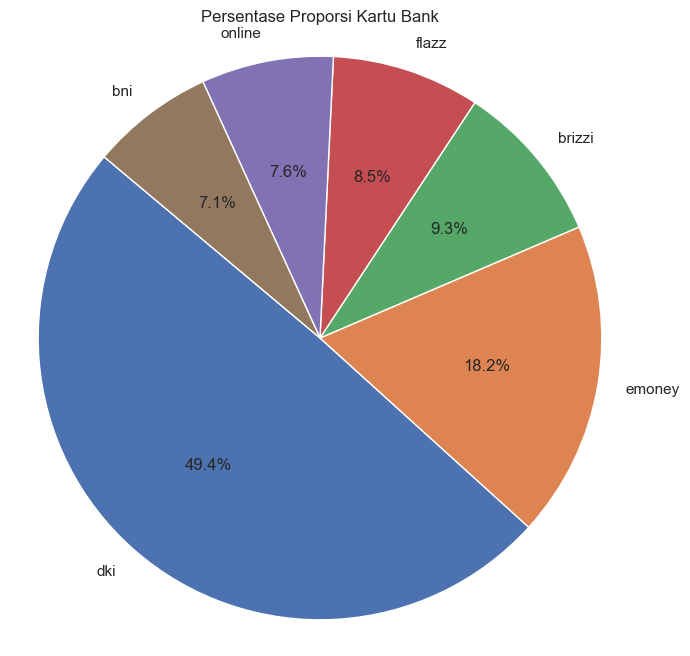

In [185]:
# Pie Chart Proporsi Pembayaran

payment_counts = df['payCardBank'].value_counts()

labels = payment_counts.index
sizes = payment_counts.values

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
plt.axis('equal')
plt.title('Persentase Proporsi Kartu Bank')
plt.show()

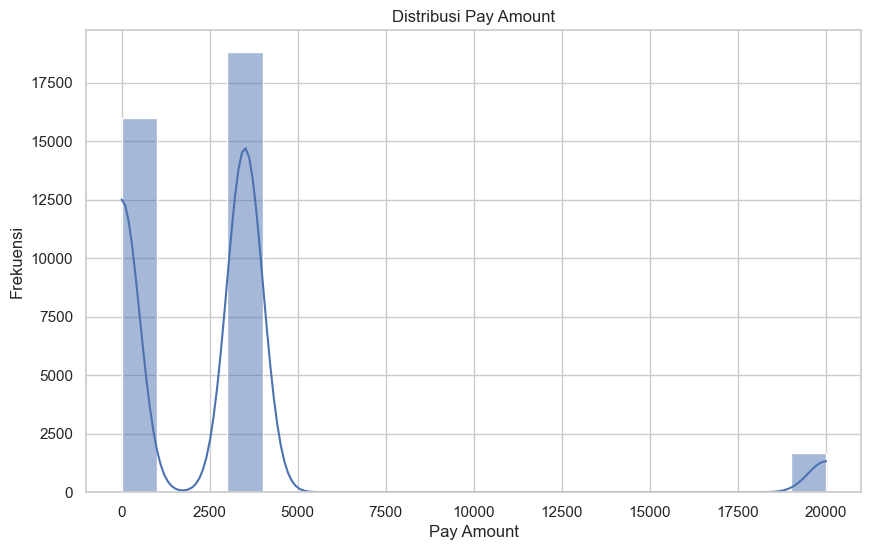

In [186]:
# Membuat grafik histplot distribusi Payment

plt.figure(figsize=(10, 6))
sns.histplot(df['payAmount'], bins=20, kde=True)
plt.title('Distribusi Pay Amount')
plt.xlabel('Pay Amount')
plt.ylabel('Frekuensi')
plt.show()

**Kita dapat memperoleh kisaran Total Revenue yg diperoleh untuk tiap-tiap Provider Payment Card pada periode tersebut**

In [187]:
# Mengelompokan berdasarkan paycard dan mengakumulasi total revenue untuk masing2 provider paycard
revenue_payCardBank = df.groupby('payCardBank')['payAmount'].sum().reset_index()

# sort revenue dari terbesar
revenue_payCardBank = revenue_payCardBank.sort_values(by='payAmount', ascending=False)

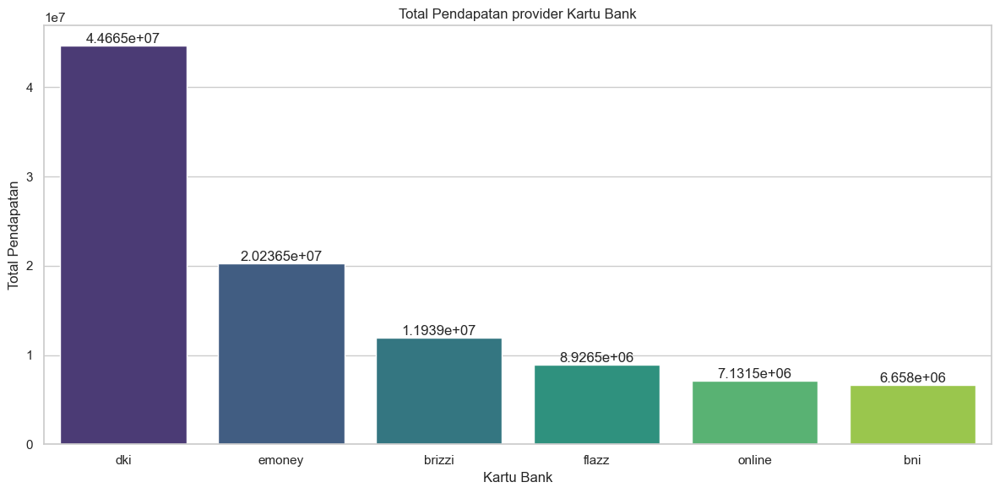

In [188]:
# Membuat grafik Barplot Total Revenue dari tiap provider kartu Bank

plt.figure(figsize=(12, 6)) 
plot = sns.barplot(x='payCardBank', y='payAmount', data=revenue_payCardBank, palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.ylabel('Total Pendapatan')
plt.xlabel('Kartu Bank')
plt.title('Total Pendapatan provider Kartu Bank')
plt.tight_layout()
plt.show()



In [189]:
print(revenue_payCardBank)

  payCardBank  payAmount
2         dki   44665000
3      emoney   20236500
1      brizzi   11939000
4       flazz    8926500
5      online    7131500
0         bni    6658000


**Insight Payment :**

Berdasarkan 2 grafik di atas, kita dapat melihat bahwa sebanyak 18015 atau 49.4% dari total pengguna Transjarta menggunakan kartu uang elektronik dari Bank DKI adalah yang paling banyak digunakan oleh pengguna Transjakarta, kemudian dibawahnya ada E-Money sebanyak 6625 atau 18.2% dan Brizzi dari bank BRI sebanyak 3390 atau 9.3%. flazz 3101, online 2765, dan yang terendah adalah bni dengan total penggunaan sebanyak 2578.

Untuk Revenue yang diperoleh oleh provider, yang terbesar didapatkan dari Bank DKI sebesar 44.665.000, kemudian Emoney, Brizzi, Flazz, online dan BNI. Dari data tersebut dapat diketahui bahawa Bank DKI memperoleh Revenue terbesar, sehingga Bank DKI dapat terus mempertahankan serta meningkatkan promosi terhadap pengguna transajakarta, khususnya bagi pengguna yang berusia kelompok usia dewasa agar pengguna transjarata tetap loyal untuk menggunakan Kartu Bank DKI. Untuk provider kartu Bank Lain, diperlukan peningkatan promosi yang tertuju pada pengguna layanan transjarta, seperti promosi diskon, promosi iklan di Halte-halte yang ramai pengguna, serta kegiatan event sales di halte-halte tanpa mengganggu perjalanan pengguna Transjakarta. 

**Distribusi Kelompok Usia Penumpang Transjakarta**

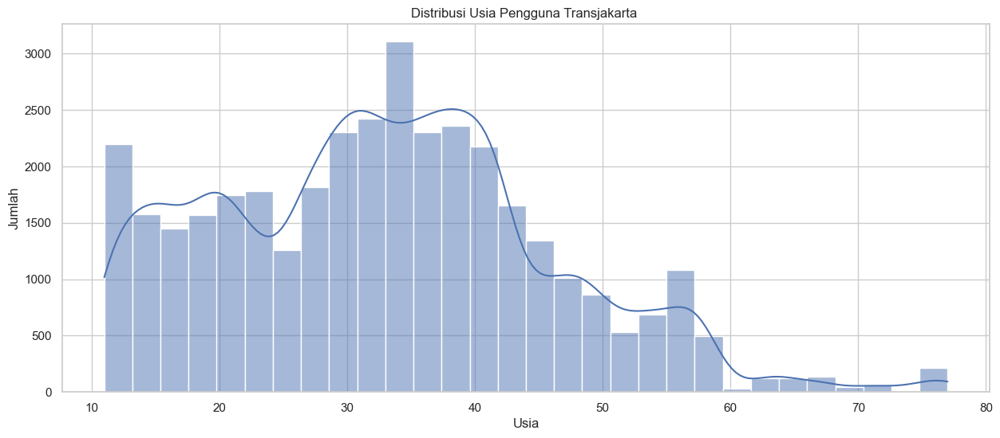

In [190]:
# Membuat grafik distribusi Usia pengguna Transjakarta

plt.figure(figsize=(15, 6))
sns.histplot(data=df, x='age', bins=30, kde=True)
plt.title('Distribusi Usia Pengguna Transjakarta ')
plt.xlabel('Usia')
plt.ylabel('Jumlah')
plt.show()

In [191]:
# usia dibreakdwon berdasarkan kategori

age_Category_Count = df['ageCategory'].value_counts().reset_index()
age_Category_Count

,ageCategory,count
0,Dewasa,30520
1,Remaja,4445
2,Anak-anak,775
3,Lansia,734


In [192]:
# usia dibreakdwon berdasarkan Range/rentang usia

age_Range_Count = df['ageRange'].value_counts().reset_index()
age_Range_Count

,ageRange,count
0,31-40,11313
1,21-30,8008
2,41-50,5926
3,12-17,4445
4,51-60,2807
5,18-20,2466
6,Under 12,775
7,Lansia,734


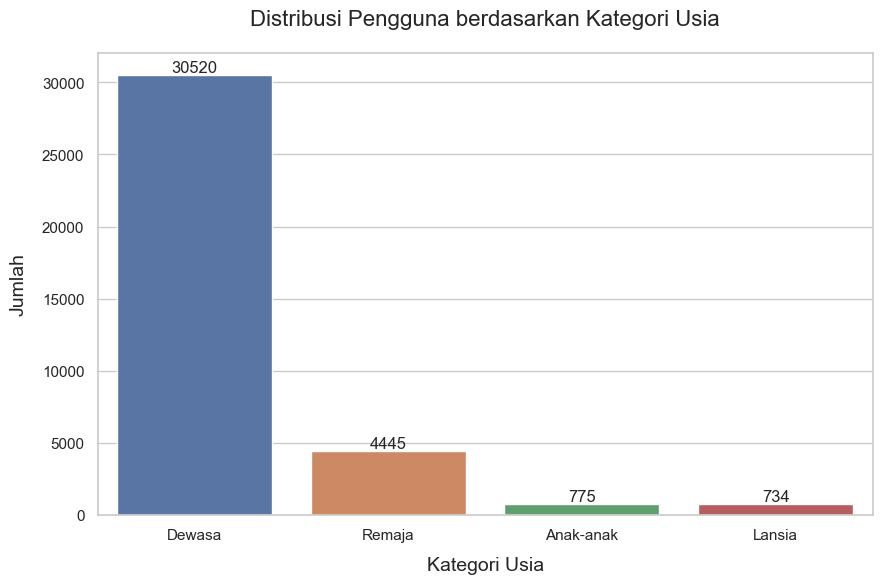

In [193]:
# Membuat grafik barplot distribusi Pengguna berdasarkan Kategori Usia

plt.figure(figsize=(10,6))
plot = sns.barplot(data=age_Category_Count, y='count', x='ageCategory')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('Distribusi Pengguna berdasarkan Kategori Usia', size=16, pad=20)
plt.xlabel('Kategori Usia', size =14, labelpad = 10)
plt.ylabel('Jumlah', size =14, labelpad = 10)
plt.show()

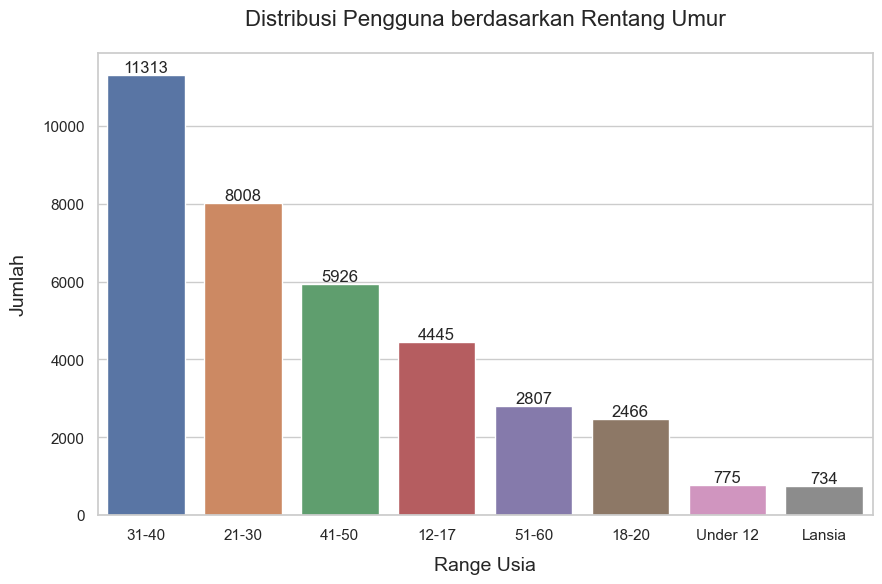

In [194]:
# Membuat grafik barplot distribusi Pengguna berdasarkan rentang Usia

plt.figure(figsize=(10,6))
plot = sns.barplot(data=age_Range_Count, y='count', x='ageRange')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('Distribusi Pengguna berdasarkan Rentang Umur', size=16, pad=20)
plt.xlabel('Range Usia', size =14, labelpad = 10)
plt.ylabel('Jumlah', size =14, labelpad = 10)
plt.show()

**Insight Pengguna Transjakarta berdasarkan Kelompok Usia :**

Berdasarkan grafik diatas, diketahui bahwa mayoritas pengguna Transjakarta berada pada kategori usia Dewasa (18-60 tahun) sebesar 30520 yaitu dengan sebaran Range usia "31-40" tahun memiliki proporsi terbesar dengan 11313 pengguna, lalu diikuti oleh range Usia "21-30" sebesar 8008 pengguna dan "41-50" dengan 5926 pengguna, kemudian untuk kategori usia Remaja (12-17) yakni sebesar 4445 pengguna. Kelompok usia dengan jumlah pengguna paling sedikit adalah lansia yaitu usia di atas 60 tahun" sebesar 734 pengguna.

- Dari grafik diatas dapat dilihat bahwa pengguna transjakarta didominasi oleh penumpang dengan kategori usia Dewasa dan remaja.
- Grafik diatas berfungsi sebagai pendukung atau untuk memvalidasi bahwa terdapat pengguna transjakarta dengan kategori Lansia.
- Dapat dilihat bahwa pesebaran pengguna Transjakarta didominasi oleh kategori usia dewasa dan remaja, namun bukan berarti penyesuaian fasilitas khusus kategori usia lansia dan anak-anak tidak perlu diperhatikan. layanan transportasi Transjakarta juga harus tetap ramah terhadap lansia, anak-anak dan orang berkebutuhan khusus. Oleh karena itu, walapun jumlah penumpang dengan kategori lansia tidak banyak, namun tingkat urgensinya sangat tinggi dan untuk memenuhi kebijakan transportasi tersebut, evaluasi terhadap penggunaan transjakarta berdasarka kategori usia perlu di analisis lebih lanjut.
- Dengan melihat pesebaran usia pengguna Transjakarta, kita dapat mengidentifikasi kebutuhan khusus yang mungkin dimiliki oleh kelompok usia tertentu. Misalnya, jika terdapat pengguna transjakarta dalam kelompok usia lanjut dan anak-anak, maka diperlukan penyesuaian fasilitas seperti aksesibilitas yang lebih baik, tempat duduk yang nyaman dan prioritas untuk Lansia dan anak-anak

**Jenis Kelamin Pengguna**

In [195]:
# mencari jumlah pengguna berdasarkan jenis kelamin/gender

gender= df['payCardSex'].value_counts().reset_index()
gender

,payCardSex,count
0,F,19429
1,M,17045


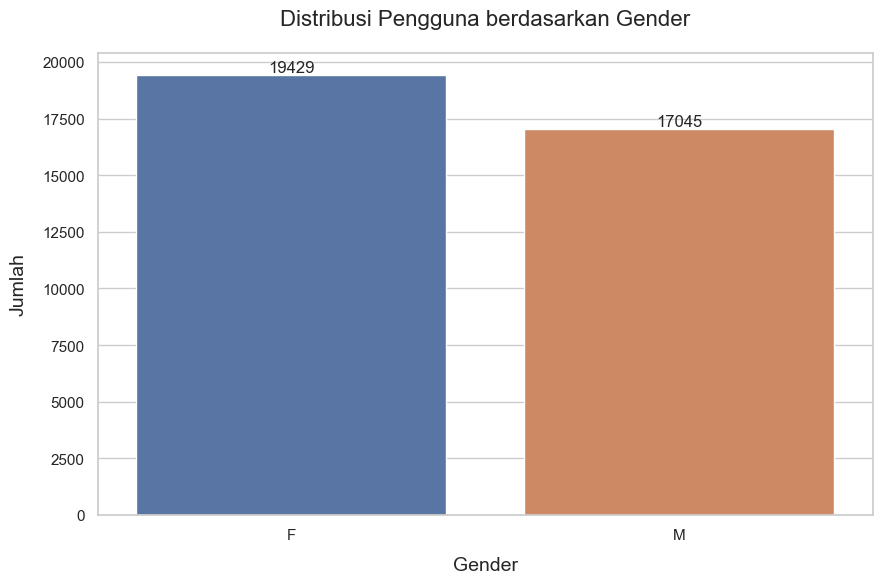

In [196]:
# Membuat grafik barplot Distribusi Pengguna berdasarkan Gender

plt.figure(figsize=(10,6))
plot = sns.barplot(data=gender, y='count', x='payCardSex')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('Distribusi Pengguna berdasarkan Gender', size=16, pad=20)
plt.xlabel('Gender', size =14, labelpad = 10)
plt.ylabel('Jumlah', size =14, labelpad = 10)
plt.show()

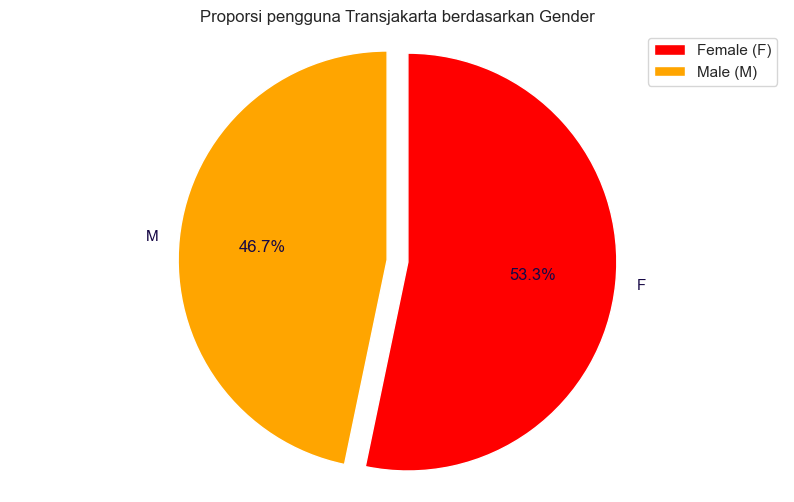

In [197]:
# Membuat grafik Pie Chart untuk melihat proporsi Distribusi Pengguna berdasarkan Gender

plt.figure(figsize=(10,6))
plt.pie(gender['count'],
        labels=gender['payCardSex'],
        autopct='%.1f%%',
        colors=['red','orange'],
        startangle=90,
        counterclock=False,
        explode=[0.1,0],
        textprops={'color':'#170845'})
plt.axis('equal')
plt.legend(['Female (F)', 'Male (M)'])
plt.title('Proporsi pengguna Transjakarta berdasarkan Gender')
plt.show()

**Insight Pengguna Transjakarta berdasarkan Jenis Kelamin/Gender :**

- Grafik dan digram Pie Chart diatas menggambarkan proporsi jumlah penumpang Transjakarta berdasarkan gender. Data tersebut diambil dari kolom "payCardSex" yg sesuai dengan yang tercantum pada kartu pengguna.
- Dapat dilihat bahwa proporsi penumpang wanita lebih banyak sejumlah 19429 atau 53.3 % dibandingkan dengan proporsi penumpang pria sebesar 17045 atau 46.7%. Dari proporsi ini diketahui bahwa perbedaan proporsi keduanya (Wanita dan pria) tidak terlalu besar. Namun terkait dengan kebijakan armada khusus wanita dengan tujuan memberikan rasa aman dan nyaman akan kejahatan seksual di area operasional transjakarta, maka data ini dapat dijadikan acuan bahwa penumpang wanita masih mendominasi dan kebijakan Transjakarta dalam memberikan fasilitas bus khusus wanita sudah sesuai dan tepat sasaran.

## **Jenis Transjakarta yang Digunakan Oleh Pengguna Kartu DKI**

Disini akan dibuat variabel baru untuk mengetahui jenis transjakarta apa yang digunakan oleh pengguna kartu dki. Kenapa hanya pengguna kartu dki saja karena dari segmen payment diketahui kartu yang paling banyak digunakan adalah dki yang berikutnya akan dijadikan sebuah rekomendasi Transjakarta untuk berkerja sama dengan Bank DKI.

In [198]:
# mencari jumlah jenis Transtype

TransType= df['transType'].value_counts().reset_index()
TransType

,transType,count
0,Regular Transjakarta,18799
1,JakLingko,15987
2,RoyalTrans,1688


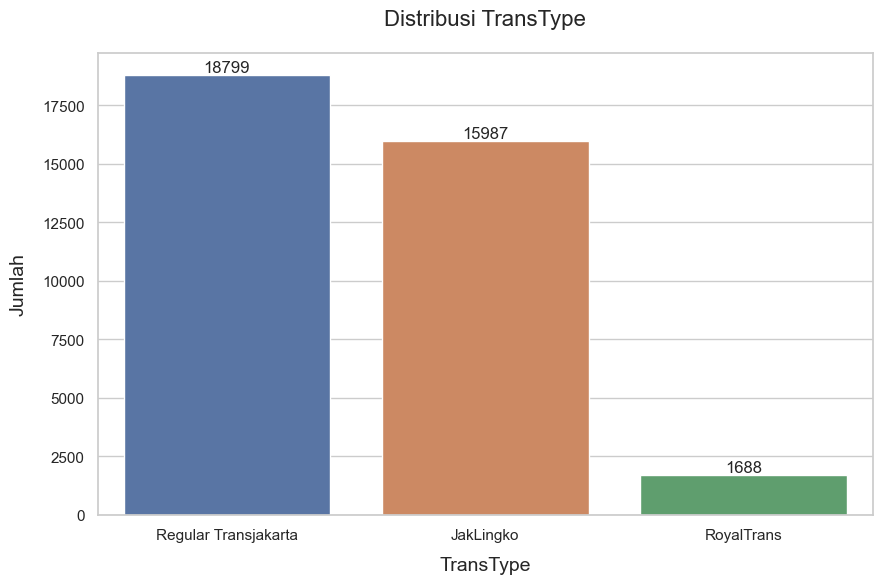

In [199]:
# Membuat Grafik barplot Distribusi TransType

plt.figure(figsize=(10,6))
plot = sns.barplot(data=TransType, y='count', x='transType')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('Distribusi TransType', size=16, pad=20)
plt.xlabel('TransType', size =14, labelpad = 10)
plt.ylabel('Jumlah', size =14, labelpad = 10)
plt.show()

**Insight**

Transtype yang paling banyak digunakan oleh penumpamg adalah jenis Regular Transjakarta sejumlah 18799, kemudian jenis jakLingko sebesar 	15987, dan yang terkecil adalah jenis armda RoyalTrans sebesar 1688. Regular Transjarta banyak digunakan dikarenakan rute Transjakarta Regular mencakup wilayah area yg luas dan mendominasi sebagian besar wilayah Jakarta, sedangkan Royaltrans melayani daerah penyangga ibukota (Bodetabek) dengan tarif yang lebih mahal yaitu 20.000

In [200]:
# Membuat variabel baru untuk mengelompokkan pengguna Kartu Bank DKI Saja

kartu_dki = df[df['payCardBank'] == 'dki']
kartu_dki = kartu_dki[['payCardID', 'payCardBank', 'ageCategory', 'transType']]
groupedby_ageCategory_dki = kartu_dki.groupby(['ageCategory', 'transType']).size().reset_index(name='count')
groupedby_ageCategory_dki

,ageCategory,transType,count
0,Anak-anak,JakLingko,88
1,Anak-anak,Regular Transjakarta,120
2,Anak-anak,RoyalTrans,40
3,Dewasa,JakLingko,7479
4,Dewasa,Regular Transjakarta,7243
5,Dewasa,RoyalTrans,625
6,Lansia,JakLingko,135
7,Lansia,Regular Transjakarta,321
8,Lansia,RoyalTrans,2
9,Remaja,JakLingko,762


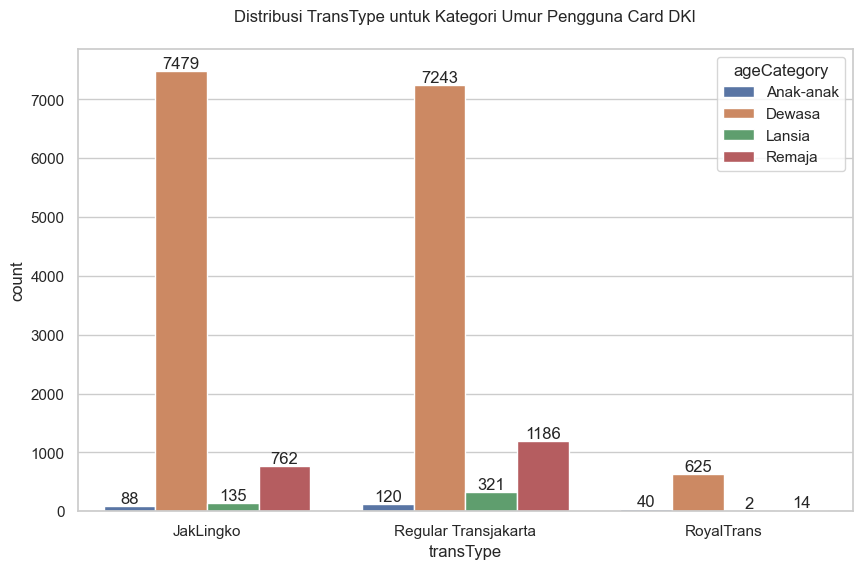

In [201]:
# Membuat grafik barplot Distribusi TransType untuk Kategori Umur Pengguna Card DKI

plt.figure(figsize = (10,6))
plot = sns.barplot(data = groupedby_ageCategory_dki, x = "transType", y = "count", hue = "ageCategory")
plt.title('Distribusi TransType untuk Kategori Umur Pengguna Card DKI', size=12, pad=20)

for i in range(4):
    plot.bar_label(plot.containers[i],label_type='edge')
plt.show()

**Insight Jenis Transjakarta yang Digunakan Oleh Pengguna Kartu DKI :**

Dari grafik diatas, Regular Transjakarta merupakan jenis TransType yang paling banyak digunakan untuk perjalanan dari kategori umur **Dewasa** yang paling banyak menggunakan kartu dki.Hal tersebut dapat dimanfaatkan oleh Bank DKI untuk terus meningkatkan layanan dan promosi terhadap pengguna transjakarta, khusunya bagi pengguna yang berusia dewasa. manfaatkan distrobusi demografi tersebut untuk meningkatkan revenue Bank DKI.

## **Pola Perjalanan Transjakarta Secara Umum**

Berdasarkan :
- Koridor terpadat
- Koridor terpadat saat jam sibuk pagi dan sore
- Halte keberangkatan maupun kedatangan terpadat saat jam sibuk pagi dan sore hari

In [202]:
# Mencari Koridor terpada

korridorID_name = df.groupby(['corridorID', 'corridorName']).size().reset_index(name='Count')
korridorID_name_Top10 = korridorID_name.sort_values(by='Count', ascending=False).head(10)
korridorID_name_Top10

,corridorID,corridorName,Count
40,1T,Cibubur - Balai Kota,389
216,S21,Ciputat - CSW,383
196,JIS3,Harmoni - Jakarta International Stadium,342
120,JAK.06,Kampung Rambutan - Pondok Gede,335
14,11P,Rusun Pondok Bambu - Walikota Jakarta Timur,333
93,8C,Kebayoran Lama - Tanah Abang,329
44,2E,Rusun Rawa Bebek - Kodamar,312
101,9D,Pasar Minggu - Tanah Abang,311
210,M7B,BKN - Blok M,308
76,6N,Ragunan - Blok M via Kemang,300


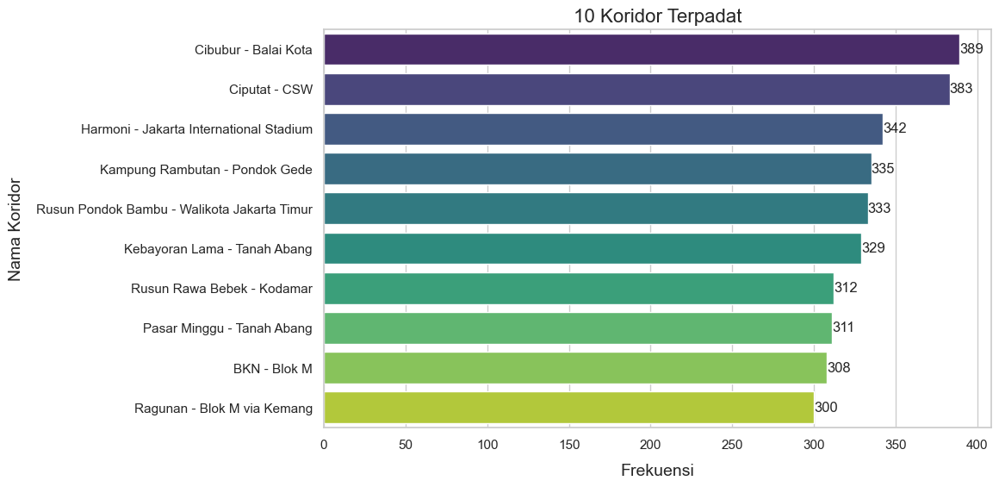

In [203]:
# Membuat grafik barplot 10 koridor Terpadat

plt.figure(figsize=(10,6))
plot = sns.barplot(data=korridorID_name_Top10, y='corridorName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('10 Koridor Terpadat', size=16)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Koridor', size =14, labelpad = 10)
plt.show()

**Insight**

Jumlah Penggunaan Per Koridor yang paling tertinggi:

Koridor Cibubur - Balai Kota merupakan koridor yang paling banyak digunakan.
Koridor lain seperti Ciputat - CSW, Pulogadung - Monas, dan Harmoni - Jakarta international Stadium juga memiliki penggunaan yang signifikan. Beberapa koridor lain memiliki volume pengguna yang lebih rendah.

Berdasarkan grafik diatas, dapat dilihat bahwa koridor yang paling banyak digunakan adalah koridor dengan jurusan Cibubur-Balai Kota. koridor ini melintas sepanjang wilayah jakarta selatan dan jakarta pusat. Halte pada koridor ini merupakan akses ke wilayah perkantoran di jakarta. Koridor terpadat lainnya juga masih melintas disekitar wilayah jakarta pusat dan selatan. Oleh karena itu, untuk evaluasi efisiensi koridor dan armada secara keseluruhan dan tanpa memperhatikan jam sibuk, PT.Transjakarta dapat berfokus diwilayah ini untuk meningkatkan layanan dan efisiensi armada. 

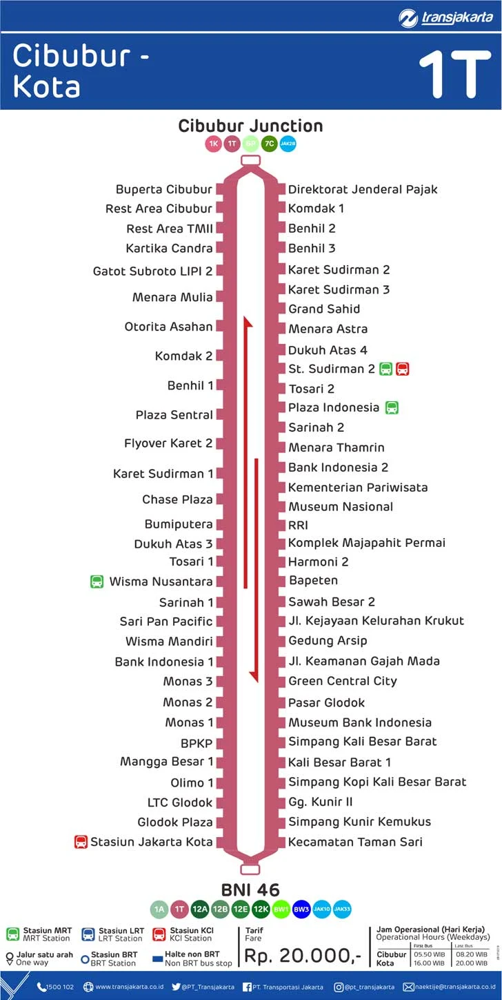

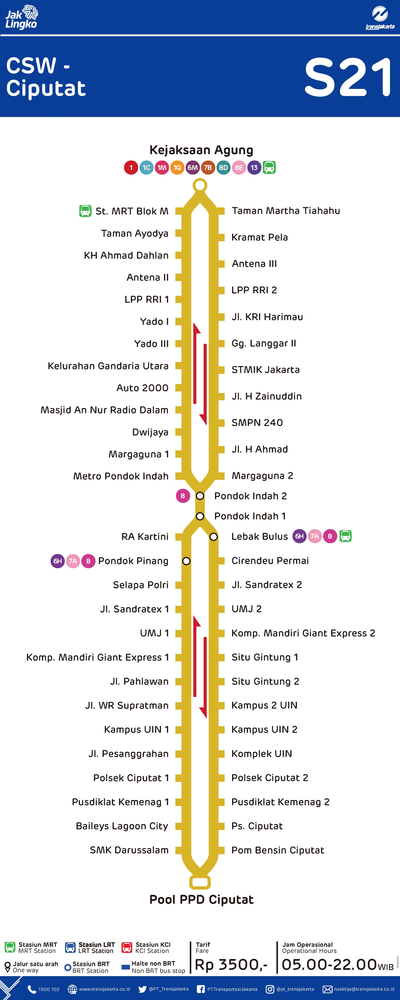

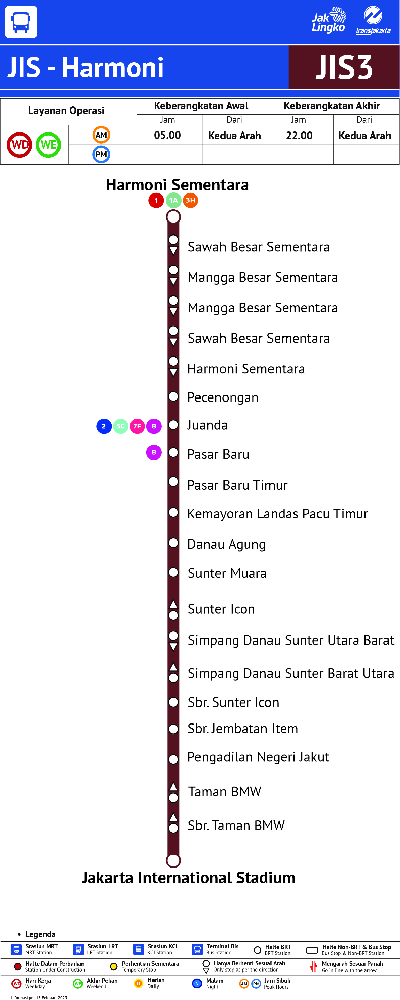

## Berdasarkan Waktu Sibuk Halte Transjakarta

Melihat bagaimana traffic dari koridor Transjakarta. Kita akan menganalisis kolom tapInTime, tapOutTime, tapInStopsName dan tapOutStopsName

**Dari segi jam dengan tap in dan tap out tertinggi**

In [204]:
# Mengelompokkan data berdasarkan 'tapInHour' dan menghitung jumlah trip
grouped_data = df.groupby('tapInHour').size().reset_index(name='jumlah_trip')


In [205]:
# Membuat DataFrame dengan semua jam dari 0 hingga 23
all_hours = pd.DataFrame({'tapInHour': range(24)})

In [206]:
# Gabungkan data yang ada dengan semua jam
grouped_data = all_hours.merge(grouped_data, on='tapInHour', how='left')
grouped_data['jumlah_trip'].fillna(0, inplace=True)
grouped_data = grouped_data.sort_values(by='tapInHour')
grouped_data

,tapInHour,jumlah_trip
0,0,0.0
1,1,0.0
2,2,0.0
3,3,0.0
4,4,0.0
5,5,3234.0
6,6,5619.0
7,7,2693.0
8,8,2779.0
9,9,2714.0


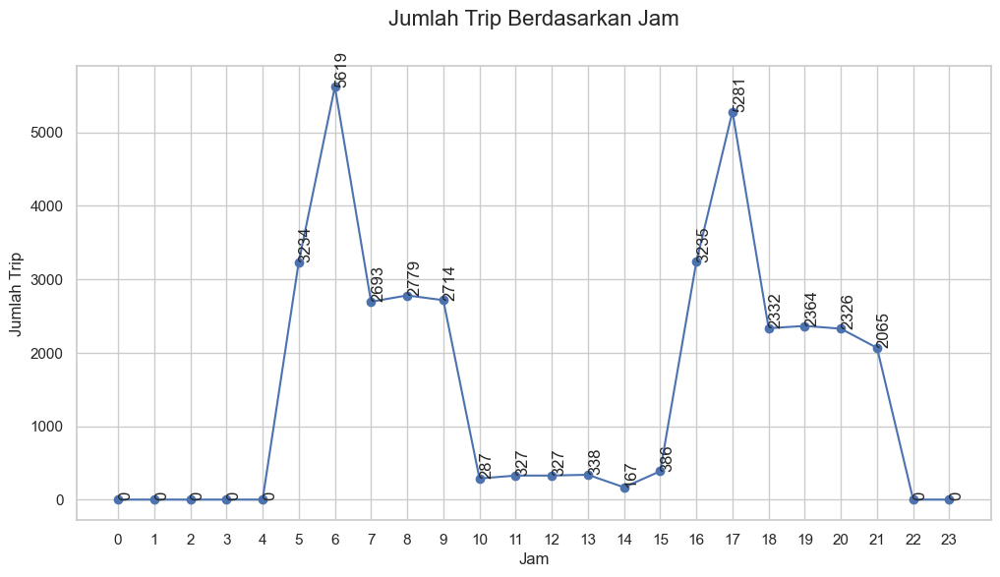

In [207]:
# Membuat line chart Jumlah Trip per Jam
plt.figure(figsize=(12, 6))
plt.plot(grouped_data['tapInHour'], grouped_data['jumlah_trip'], marker='o')
plt.xlabel('Jam')
plt.ylabel('Jumlah Trip')
plt.title('Jumlah Trip Berdasarkan Jam', size =16, pad =30)
plt.xticks(range(24))
# plt.grid()

for i, j in zip(grouped_data['tapInHour'], grouped_data['jumlah_trip']):
    plt.text(i, j, str(int(j)), ha='left', va='bottom', rotation='vertical')

plt.show()

**Insight**

Dari grafik diatas, peak hours atau puncak jam sibuk terdapat di **jam 5 sampai jam 6** di pagi hari (Jam sibuk pagi hari ) dan **jam 16 sampai jam 17** di sore hari (Jam sibuk sore hari).
Dapat disimpulkan Jam sibuk Transjakarta terjadi saat Pengguna memulai beraktifitas berangkat kerja yakni sekitar pukul **5-6 pagi** dan saat jam pulang kantor yakni pukul **16 sampai 17**.
Dan dapat diasumsikan Jam Sibuk pagi yaitu antara **jam 5 sampai jam 9** dan jam sinuk sore hari yaitu antara **16 sampai 21**.

**Koridor yang sering digunakan pada waktu sibuk**

In [208]:
# Membuat Fungsi jam sibuk pagi dan jam sibuk sore
def jam_sibuk(jam):
    if 5 <= jam <= 9:
        return 'jam_sibuk_pagi'
    elif 16 <= jam <= 21:
        return 'jam_sibuk_sore'
    else:
        return 'bukan_jam_sibuk'

df['Jam_sibuk'] = df['tapInHour'].apply(jam_sibuk)

**Koridor yang sering digunakan saat jam sibuk pagi yaitu antara jam 5-9**

In [209]:
# Mencari koridor terpadat saat jam sibuk pagi

jam_sibuk_pagi = df[df['Jam_sibuk'] == "jam_sibuk_pagi"].groupby(['corridorID', 'corridorName']).size().reset_index(name='Count')
jam_sibuk_pagi = jam_sibuk_pagi.sort_values(by='Count', ascending=False).head()
jam_sibuk_pagi

,corridorID,corridorName,Count
40,1T,Cibubur - Balai Kota,193
216,S21,Ciputat - CSW,186
120,JAK.06,Kampung Rambutan - Pondok Gede,164
14,11P,Rusun Pondok Bambu - Walikota Jakarta Timur,163
196,JIS3,Harmoni - Jakarta International Stadium,162


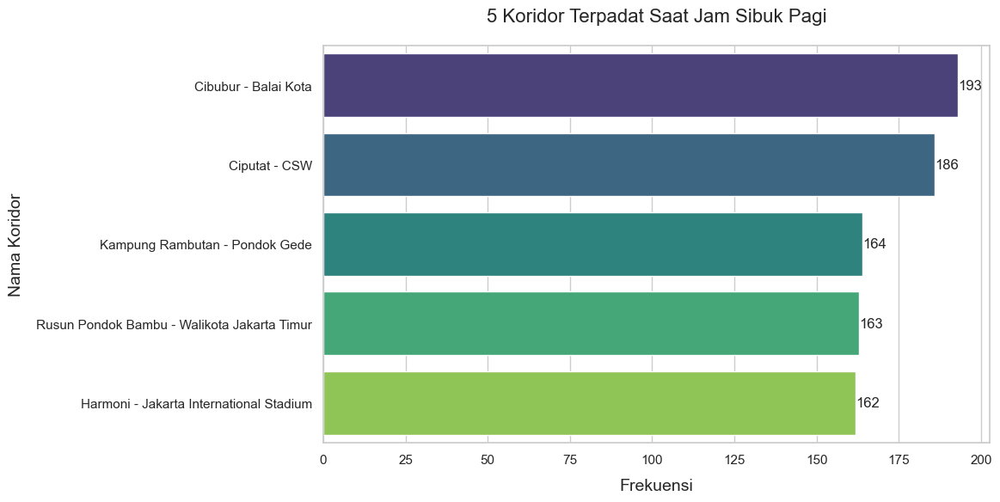

In [210]:
# Membuat grafik koridor terpadat saat jam sibuk pagi

plt.figure(figsize=(10,6))
plot = sns.barplot(data=jam_sibuk_pagi, y='corridorName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Koridor Terpadat Saat Jam Sibuk Pagi', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Koridor', size =14, labelpad = 10)
plt.show()

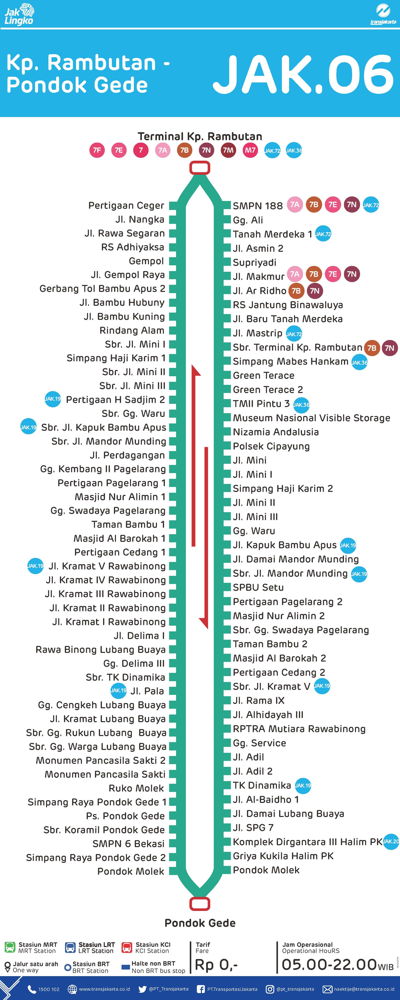

**Insight**

untuk 5 Koridor Terpadat Saat Jam Sibuk Pagi, Koridor Cibubur - Balai Kota merupakan koridor yang paling banyak digunakan. Koridor lain seperti Ciputat - CSW. Beberapa koridor lain memiliki volume pengguna yang lebih rendah. Koridor yang memiliki volume penggunaan tertinngi tersebut adalah koridor yang melayani rute daerah Jakarta Pusat dan Jakarta Selatan, dimana daerah tersebut merupakan daerah perkantoran dan pusat bisnis Jakarta.


**Koridor yang sering digunakan saat jam sibuk sore yaitu antara jam 16-21**

In [211]:
# Mencari koridor terpadat saat jam sibuk sore

jam_sibuk_sore= df[df['Jam_sibuk'] == "jam_sibuk_sore"].groupby(['corridorID', 'corridorName']).size().reset_index(name='Count')
jam_sibuk_sore= jam_sibuk_sore.sort_values(by='Count', ascending=False).head()
jam_sibuk_sore

,corridorID,corridorName,Count
40,1T,Cibubur - Balai Kota,191
216,S21,Ciputat - CSW,182
196,JIS3,Harmoni - Jakarta International Stadium,172
120,JAK.06,Kampung Rambutan - Pondok Gede,165
14,11P,Rusun Pondok Bambu - Walikota Jakarta Timur,165


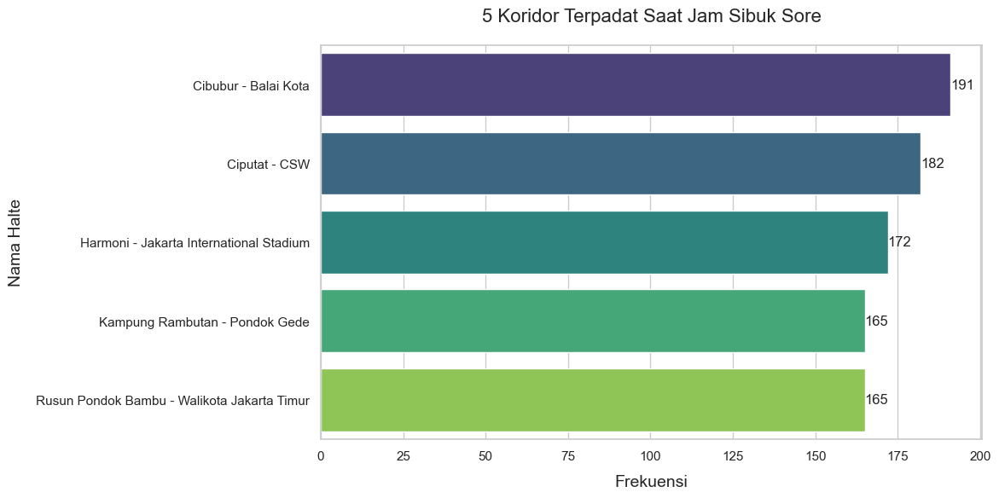

In [212]:
# Membuat grafik koridor terpadat saat jam sibuk sore

plt.figure(figsize=(10,6))
plot = sns.barplot(data=jam_sibuk_sore, y='corridorName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Koridor Terpadat Saat Jam Sibuk Sore', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Halte', size =14, labelpad = 10)
plt.show()

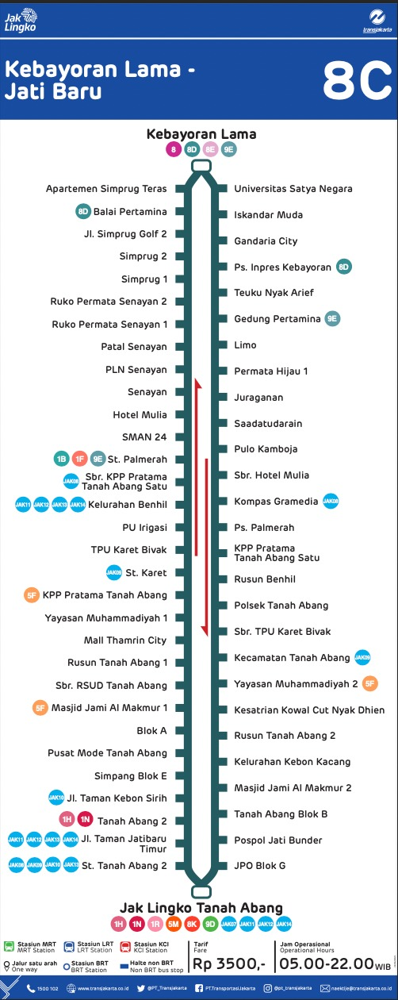

**Insight**

Koridor terpadat saat jam Sibuk sore hari adalah Cibubur - Balai Kota, Harmoni - Jakarta International Stadium, Kebayoran Lama - Tanah Abang. Koridor tersebut adalah koridor yang melayani rute daerah Jakarta Pusat dan Jakarta Selatan, dimana daerah tersebut merupakan daerah perkantoran dan pusat bisnis Jakarta. sehingga tidak heran jika koridor-koridor tersebut adalah koridor terpadat atau terdapat saat jam sibuk pagi hari maupun jam sibuk sore

**Halte Keberangkatan yang sering digunakan saat jam sibuk pagi yaitu antara jam 5-9**

In [213]:
# Mencari Halte Keberangkatan terpadat saat jam sibuk pagi

jam_sibuk_pagi_tapIn= df[df['Jam_sibuk'] == "jam_sibuk_pagi"].groupby(['tapInStops', 'tapInStopsName']).size().reset_index(name='Count')
jam_sibuk_pagi_tapIn= jam_sibuk_pagi_tapIn.sort_values(by='Count', ascending=False).head()
jam_sibuk_pagi_tapIn

,tapInStops,tapInStopsName,Count
1152,P00064,Garuda Taman Mini,139
593,B03277P,Rusun Kapuk Muara,98
1228,P00170,Penjaringan,88
1291,P00254,Tendean,81
1252,P00202,Rawa Selatan,80


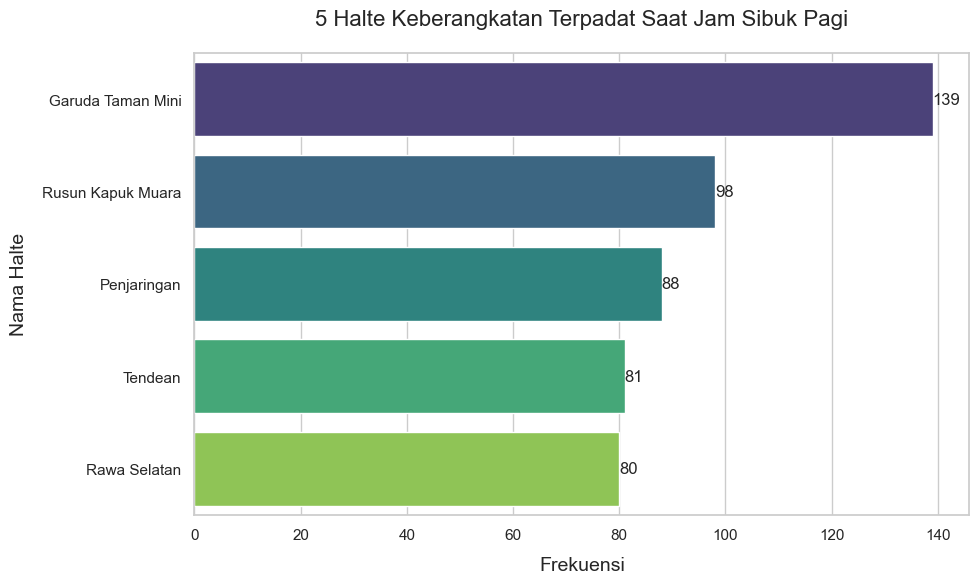

In [214]:
# Membuat grafik Halte Keberangkatan terpadat saat jam sibuk pagi

plt.figure(figsize=(10,6))
plot = sns.barplot(data=jam_sibuk_pagi_tapIn, y='tapInStopsName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Halte Keberangkatan Terpadat Saat Jam Sibuk Pagi', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Halte', size =14, labelpad = 10)
plt.show()

**Halte Keberangkatan yang sering digunakan saat jam sibuk sore yaitu antara jam 16-21**

In [215]:
# Mencari Halte Keberangkatan terpadat saat jam sibuk sore

jam_sibuk_sore_tapIn= df[df['Jam_sibuk'] == "jam_sibuk_sore"].groupby(['tapInStops', 'tapInStopsName']).size().reset_index(name='Count')
jam_sibuk_sore_tapIn= jam_sibuk_sore_tapIn.sort_values(by='Count', ascending=False).head()
jam_sibuk_sore_tapIn

,tapInStops,tapInStopsName,Count
1277,P00170,Penjaringan,139
63,B00248P,Cibubur Junction,103
1272,P00164,Pejaten,96
1157,P00016,BKN,96
1361,P00297,BNN LRT,83


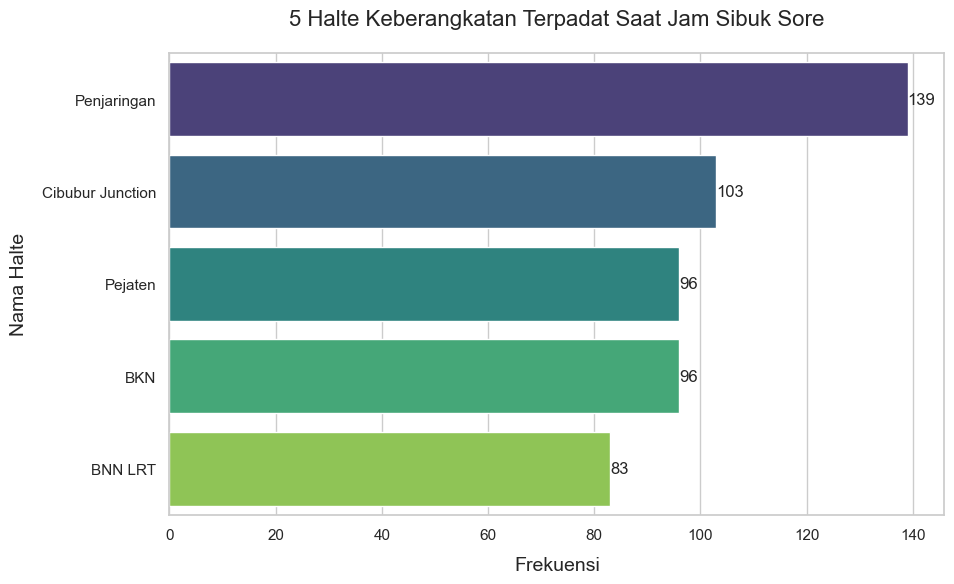

In [216]:
# Membuat grafik Halte Keberangkatan terpadat saat jam sibuk sore

plt.figure(figsize=(10,6))
plot = sns.barplot(data=jam_sibuk_sore_tapIn, y='tapInStopsName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Halte Keberangkatan Terpadat Saat Jam Sibuk Sore', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Halte', size =14, labelpad = 10)
plt.show()

**Halte Kedatangan yang sering digunakan saat jam sibuk pagi yaitu antara jam 5-9**

In [217]:
# Mencari Halte Kedatangan terpadat saat jam sibuk pagi

jam_sibuk_pagi_tapOut= df[df['Jam_sibuk'] == "jam_sibuk_pagi"].groupby(['tapOutStops', 'tapOutStopsName']).size().reset_index(name='Count')
jam_sibuk_pagi_tapOut= jam_sibuk_pagi_tapOut.sort_values(by='Count', ascending=False).head()
jam_sibuk_pagi_tapOut

,tapOutStops,tapOutStopsName,Count
1108,P00170,Penjaringan,166
1004,P00016,BKN,159
1083,P00137,Monas,140
1070,P00112,Kejaksaan Agung,102
38,B00221P,Bundaran Senayan 1,98


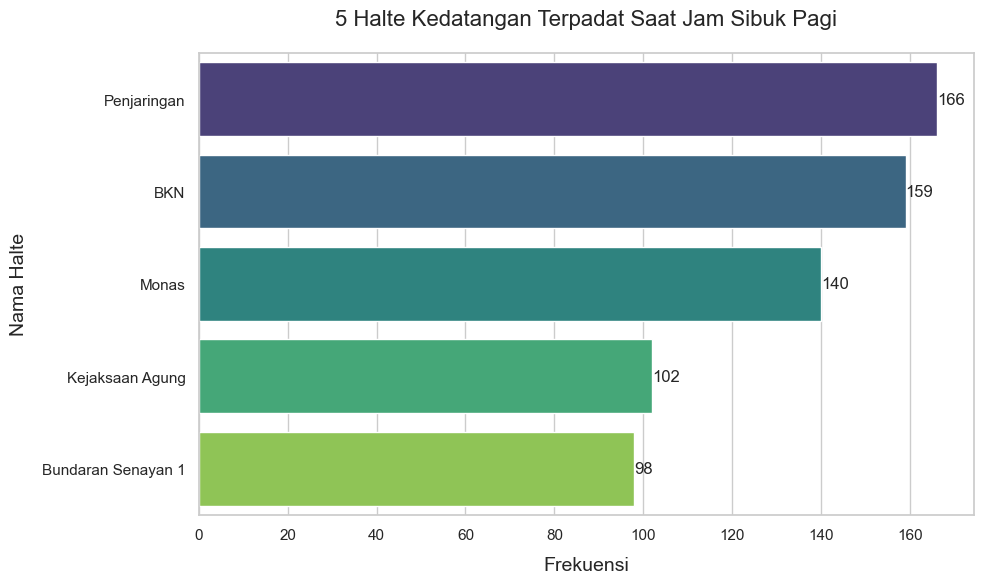

In [218]:
# Membuat grafik Halte Kedatangan terpadat saat jam sibuk pagi

plt.figure(figsize=(10,6))
plot = sns.barplot(data=jam_sibuk_pagi_tapOut, y='tapOutStopsName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Halte Kedatangan Terpadat Saat Jam Sibuk Pagi', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Halte', size =14, labelpad = 10)
plt.show()

**Halte Kedatangan yang sering digunakan saat jam sibuk sore yaitu antara jam 16-21**

In [219]:
# Mencari Halte Kedatangan terpadat saat jam sibuk sore

jam_sibuk_sore_tapOut= df[df['Jam_sibuk'] == "jam_sibuk_sore"].groupby(['tapOutStops', 'tapOutStopsName']).size().reset_index(name='Count')
jam_sibuk_sore_tapOut= jam_sibuk_sore_tapOut.sort_values(by='Count', ascending=False).head(5)
jam_sibuk_sore_tapOut

,tapOutStops,tapOutStopsName,Count
902,B05725P,Term. Senen,157
1071,P00016,BKN,151
1185,P00179,Pinang Ranti,121
893,B05708P,Term. Kampung Rambutan,104
553,B03277P,Rusun Kapuk Muara,97


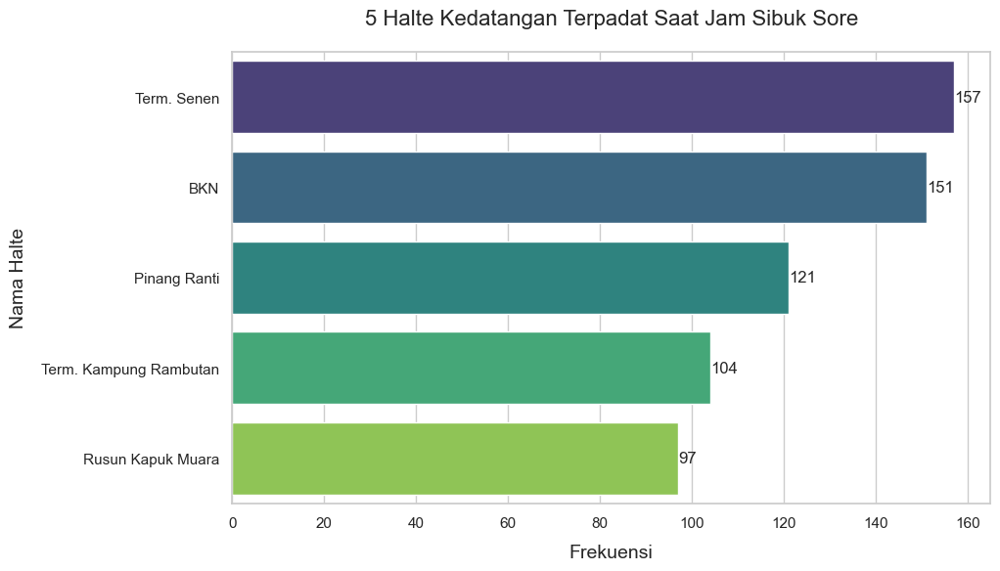

In [220]:
# Membuat grafik Halte Kedatangan terpadat saat jam sibuk sore

plt.figure(figsize=(10,6))
plot = sns.barplot(data=jam_sibuk_sore_tapOut, y='tapOutStopsName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Halte Kedatangan Terpadat Saat Jam Sibuk Sore', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Halte', size =14, labelpad = 10)
plt.show()

**Insight**

Halte dengan aktivitas tap in dan tap out terbanyak di pagi hari (5 - 9):
- Garuda Taman Mini adalah halte dengan aktivitas tap in terbanyak di pagi hari. Hal ini menandakan bahwa banyak pengguna memulai perjalanan mereka dari halte ini di pagi hari.
- Penjaringan sebagai salah satu halte dengan aktivitas tap in dan tap out yang tinggi di pagi hari. Hal Ini menunjukkan bahwa halte ini cukup sibuk di pagi hari, dengan banyak pengguna yang masuk dan khususnya keluar dari halte ini.
- Halte BKN  memiliki aktivitas tap out yang hampir sama di pagi hari dan sore hari. Hal ini dapat menandakan bahwa halte tersebut mungkin berada di lokasi yang strategis, di mana banyak orang datang di pagi hari maupun sore hari.

## **Penggunaan Transjakarta pada akhir pekan selama April 2023**

In [221]:
# mencari jumlah perjalanan per week/minggu

trip_count_per_week =df.groupby('tapInWeek').size()


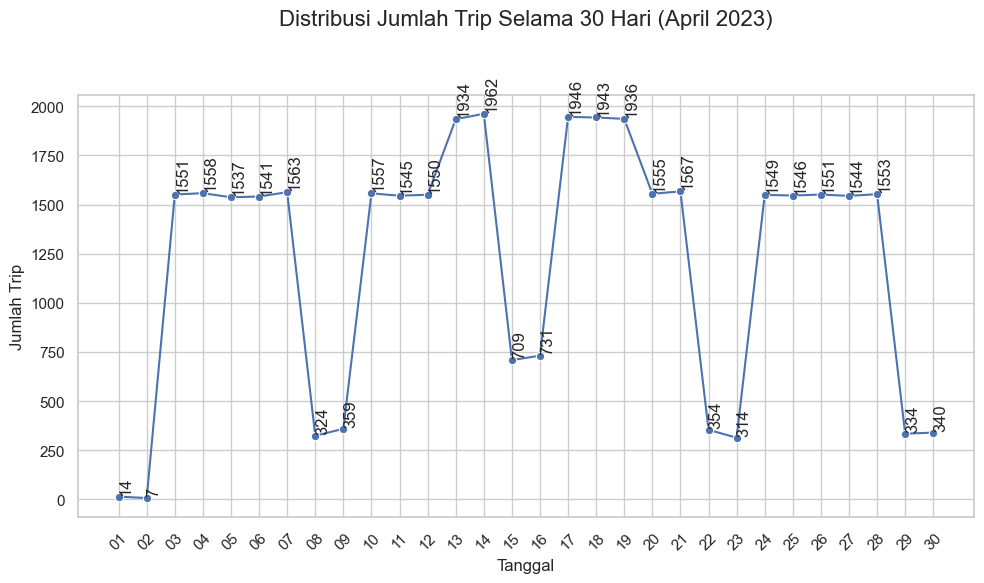

In [222]:
# Membuat Grafik disribusi trip selama sebulan

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
sns.lineplot(x=trip_count_per_week.index, y=trip_count_per_week.values, marker='o')
plt.xlabel('Tanggal')
plt.ylabel('Jumlah Trip')
plt.title('Distribusi Jumlah Trip Selama 30 Hari (April 2023)', size =16, pad =50)
plt.xticks(rotation=45)
plt.tight_layout()
plt.grid(True)


# # label points on the plot
for x, y in zip(trip_count_per_week.index, trip_count_per_week.values):

    plt.annotate(
        text = f'{y:.0f}', ha='left', va='bottom', rotation='vertical',
        xy = (x, y+10)
    )
plt.show()

**Insight**

- Dari grafik diatas, diketahui trend penggunaan transjakarta perhari selama periode april 2023 berfluktuasi sesuai dengan pola hari kerja dan akhir pekan.
- pada akhir pekan trend jumlah penumpang cenderung mengalami penurunan yang signifikan (karean tidak adanya kegitan perkantoran pemerintahan maupun swasta).

**Jam Sibuk di Akhir Pekan**

In [223]:
# Mencari hari weekend (sabtu dan minggu)

weekend = df[df['tapInDay'].isin(['Saturday', 'Sunday'])]
weekend.head(1)

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,tapInStopsName,tapInStopsLat,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,transType,tapInHour,tapOutHour,tapDay,tapInDay,tapInWeek,age,ageCategory,ageRange,Jam_sibuk
32000,TLQN677B2R72GC,6539040209758344,dki,"Puti Febi Sitorus, M.TI.",M,1999,D32,Cinere - Bundaran Senayan,0.0,B02414P,Menara Mandiri,-6.223667,106.8071,11,2023-04-09 08:31:57,B05544P,Summitmas,-6.225826,106.80402,13.0,2023-04-09 09:01:48,20000,RoyalTrans,8,9,6,Sunday,09,24,Dewasa,21-30,jam_sibuk_pagi


In [224]:
# Menentukan jam sibuk saat weekend

jam_sibuk_weekend = pd.crosstab(weekend['tapInDay'], weekend['tapInHour'])
jam_sibuk_weekend

tapInHour,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
tapInDay,,,,,,,,,,,,,,,,,
Saturday,110,91,91,116,103,88,91,109,99,79,116,111,138,106,109,103,75
Sunday,101,98,107,114,93,98,102,99,115,80,114,101,116,98,117,127,71


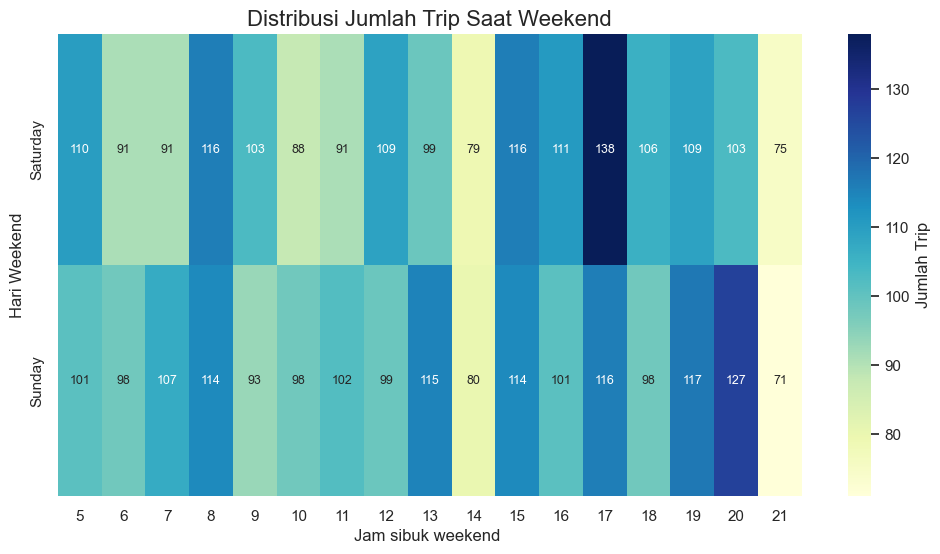

In [225]:
plt.figure(figsize=(12,6))
weekend_heatmap = sns.heatmap(jam_sibuk_weekend, annot=True, 
            annot_kws={'size':9}, fmt='.0f',cmap='YlGnBu', cbar_kws={'label': 'Jumlah Trip'})


weekend_heatmap.set_title('Distribusi Jumlah Trip Saat Weekend', size=16)
weekend_heatmap.set_xlabel('Jam sibuk weekend ', size=12)
weekend_heatmap.set_ylabel('Hari Weekend', size=12)


plt.show()

**Insight**

Dari grafik heatmap diatas dapat diketahui bahwa Jam sibuk penggunaan halte di hari libur akhir pekan memiliki pesebaran yang merata/ tidak ada perbedaan yang menonjol di antara tiap jam nya, pada jam 14.00 dan 21.00 adalah jam yang cenderung sepi pengguna Transjakarta. Pesebarannya merata baik pada hari sabtu maupun minggu. oleh karena itu, optimalisasi armada pada akhir pekan tidak perlu di fokuskan pada waktu tertentu, namun di buat lebih merata saja.

**Koridor yang sering digunakan pada akhir pekan**

In [226]:
# Menentukan koridor terpadat saat weekend

Koridor_weekend = df[(df['tapInDay'] == "Saturday") | (df['tapInDay'] == "Sunday")].groupby(['corridorID', 'corridorName']).size().reset_index(name='Count')
Koridor_weekend = Koridor_weekend.sort_values(by='Count', ascending=False).head()
Koridor_weekend

,corridorID,corridorName,Count
140,JAK.19,Pinang Ranti - Kampung Rambutan,33
133,JAK.120,JIS - Terminal Muara Angke,32
100,9C,Pinang Ranti - Bundaran Senayan,31
43,2B,Harapan Indah - ASMI,30
13,11N,Rusun Cipinang Muara - Jatinegara,28


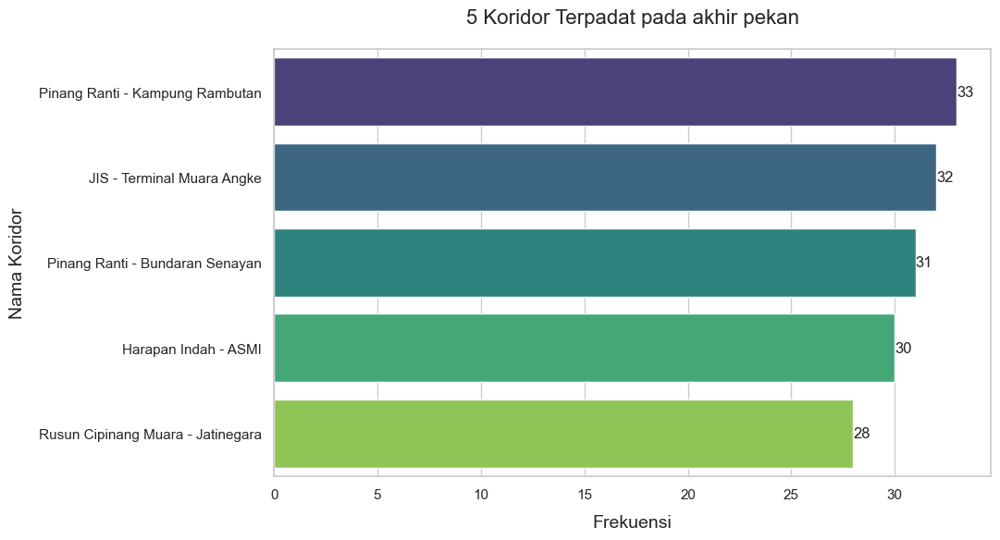

In [227]:
# Membuat grafik koridor terpadat saat weekend

plt.figure(figsize=(10,6))
plot = sns.barplot(data=Koridor_weekend, y='corridorName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Koridor Terpadat pada akhir pekan', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Koridor', size =14, labelpad = 10)
plt.show()

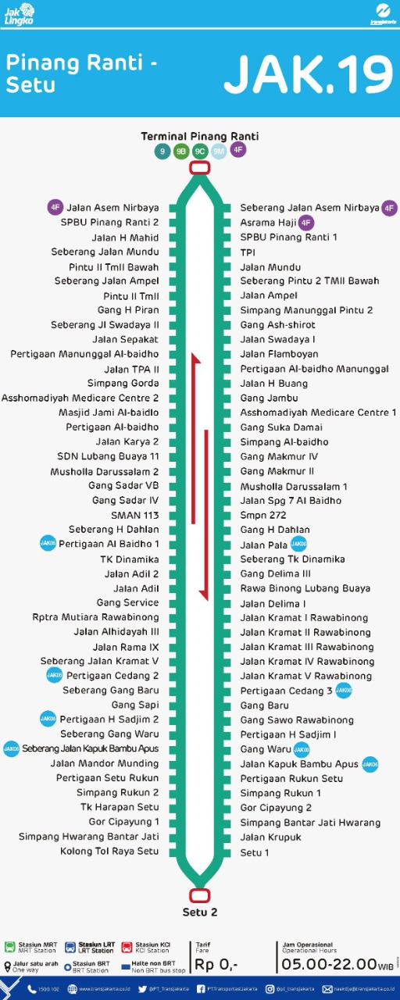

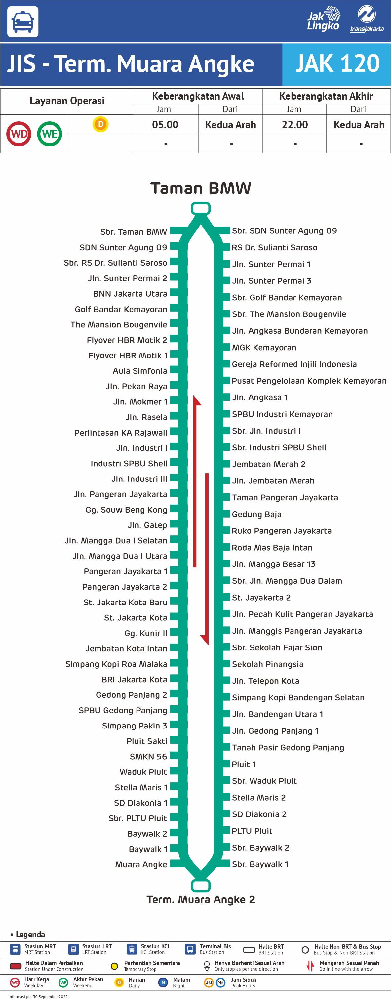

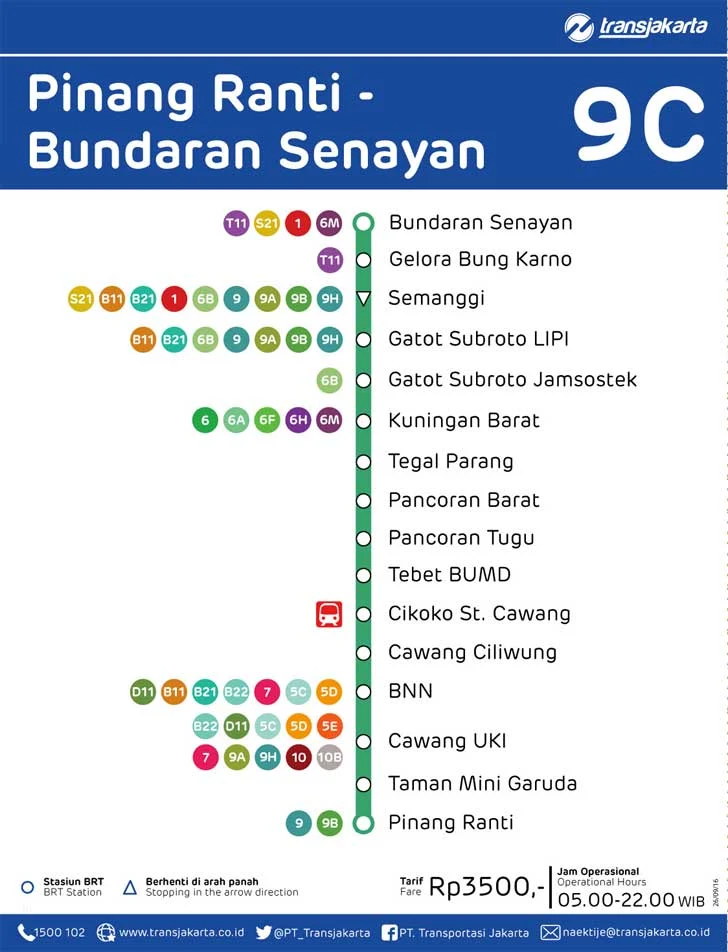

**Insight**

- Dari grafik di atas dapat dilihat bahwa 3 terbesar koridor yang banyak digunakan diakhir pekan adalah koridor Pinang Ranti - kampung rambutan, JIS- Terminal Muara angke, Pinang Ranti-Bunderan Senayan. Denagn melihat rute dari tiap2 koridor diketahui bahwa :
1. Koridor Pinang Ranti - kampung rambutan, koridor ini melewati daerah tempat wisata TMII (taman mini) di dua pintu, dan juga melalui beberapa wilayah pusat kota lainnya.
2. Koridor JIS- Terminal Muara angke - melalui pusat kota dan pusat perbelanjaan seperti baywalk, jembatan merah,mangga dua, stasiun jakarta kota, dan juga melewati daerah kota tua Jakarta yang memang banyak dikunjungi sebagai tempat wisata akhir pekan.
3. Koridor Pinang Ranti-Bunderan Senayan akan melalui area tempat wisata Tebet Eco park, dan gelora bung karno GBK Senayan.
koridor Pinang ranti-setu dan JIS- Terminal Muara angke merupakan trayek transjakarta dengan armada Mikrotrans sedangkan Pinang Ranti-Bunderan Senayan merupakan koridor dengan jenis armada Transjakarta.

## **Penggunaan Transjakarta pada Hari Libur Lebaran 2023**

Pada Bulan April 2023, terdapat libur lebaran yang jatuh pada tanggal 22 dan 23 April 2023. Oleh karean itu, mari kita lihat bagaimana pola perjalanan saat libur lebaran.

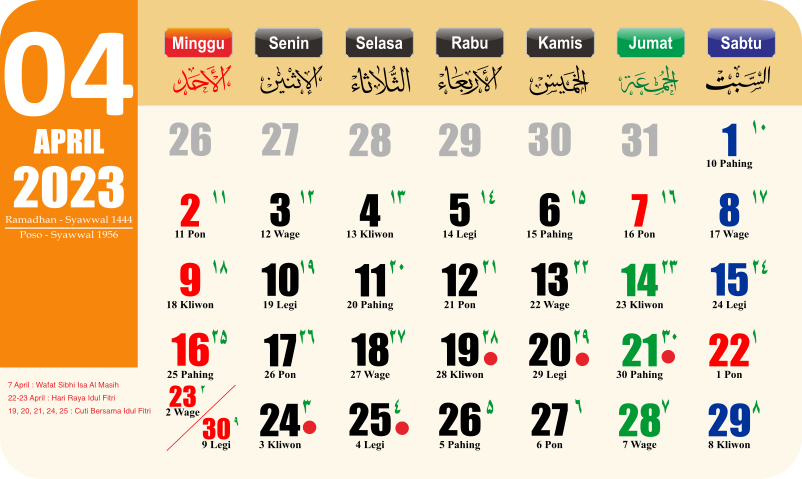

In [228]:
# Menentukan koridor terpadat saat tanggal lebaran 22 dan 23 April 2023

lebaran = df[(df['tapInWeek'] == "22") | (df['tapInWeek'] == "23")].groupby(['corridorID', 'corridorName']).size().reset_index(name='Count')
lebaran = lebaran.sort_values(by='Count', ascending=False).head(10)
lebaran

,corridorID,corridorName,Count
111,JAK.02,Kampung Melayu - Duren Sawit,10
79,7A,Kampung Rambutan - Lebak Bulus,8
121,JAK.110A,Rusun Marunda - Terminal Terpadu Pulo Gebang,8
60,5B,Stasiun Tebet - BNN,7
8,11D,Pulo Gebang - Pulo Gadung 2 via PIK,7
108,D21,Universitas Indonesia - Lebak Bulus,6
47,3A,Rusun Pesakih - Kalideres,6
4,10K,Tanjung Priok - Senen via Taman BMW,6
91,8E,Bintaro - Blok M,6
152,JAK.38,Bulak Ringin - Kampung Rambutan,6


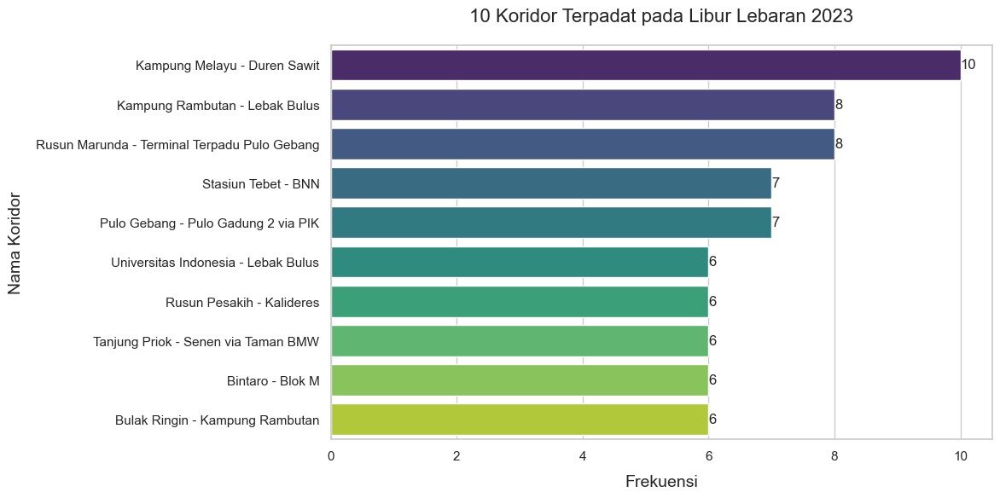

In [229]:
# Membuat grafik koridor terpadat saat Libur Lebaran 

plt.figure(figsize=(10,6))
plot = sns.barplot(data=lebaran, y='corridorName', x='Count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('10 Koridor Terpadat pada Libur Lebaran 2023', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Koridor', size =14, labelpad = 10)
plt.show()

**Insight**

Dari grafik diatas diketahui koridor mana yang paling banyak digunakan pada hari libur lebaran 2023. 

- Dapat diamati bahwa koridor-koridor pada grafik diatas merupakan koridor yang mengakses wilayah terminal seperti kampung melayu, kampung rambutan, terminal pulo-gadung stasiun tebet, pulo gebang, kebayoran lama, lebak bulus dan tanjung priok, Blok M, Kalideres. Hal tersebut kemungkinan disebabkan karena banyak orang menggunakan transjakarta untuk bisa sampai ke terminal-terminal tersebut. Sehingga di waktu lebaran masyarakat banyak menggunakan transjakarta alat transportasi menuju ke terminal bus. Hal ini mungkin terjadi disebabkan pada waktu libur lebaran warga cenderung pergi keluar wilayah jakarta untuk mudik dengan menggunakan transportasi yang tersedia di terminal. 


## **Pola Perjalanan Berdasarkan Profil Penumpang**

**Koridor yang sering digunakan berdasarkan gender penumpang khususnya Wanita**

In [230]:
df_female = df[df['payCardSex'] == 'F']

In [231]:
df_female_koridor = df_female['corridorName'].value_counts().reset_index()
df_female_koridor = df_female_koridor.sort_values(by='count', ascending=False).head()
df_female_koridor

,corridorName,count
0,Pasar Minggu - Tanah Abang,225
1,Poris Plawad - Bundaran Senayan,215
2,Rusun Rawa Bebek - Kodamar,213
3,Cilangkap - Cililitan,201
4,Terminal Tanah Merah - Pulo Gadung,199


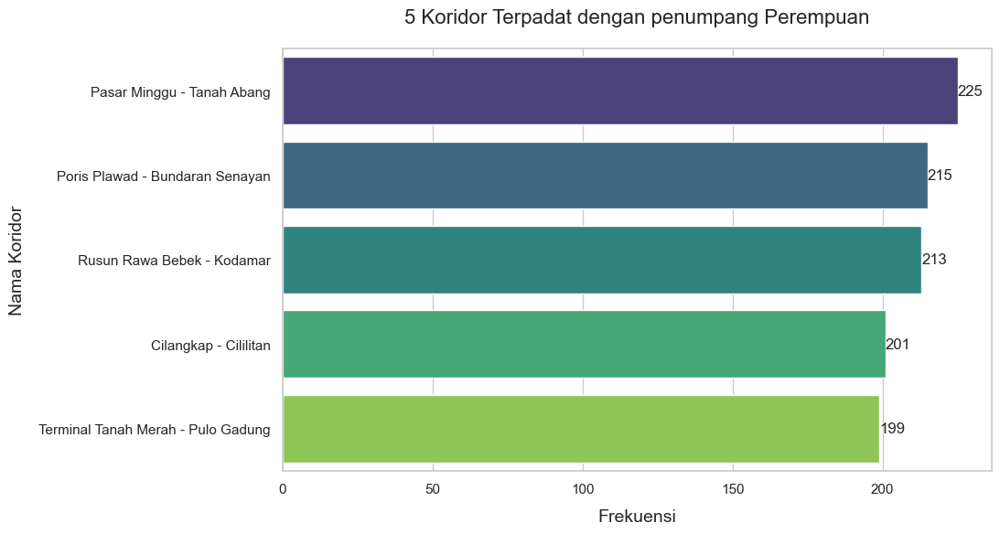

In [232]:
# Membuat grafik koridor terpadat yang sering digunakan penumpang perempuan

plt.figure(figsize=(10,6))
plot = sns.barplot(data=df_female_koridor, y='corridorName', x='count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Koridor Terpadat dengan penumpang Perempuan', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Koridor', size =14, labelpad = 10)
plt.show()

**Insight**

Berdasarkan grafik, penumpang perempuan banyak menggunakan transjakarta diantaranya pada koridor Pasar Minggu - Tanah Abang, Poris Plawad - Bundaran Senayan dan Rusun Rawa Bebek - Kodamar. Dengan demikian, berdasarkan evaluasi pada periode April 2023 ini, kelima koridor tersebut perlu diprioritaskan apabila ada rencana perbaikan pada halte maupun armada dalam koridor tersebut yang lebih ramah untuk digunakan penumpang perempuan.
 

**Koridor yang sering digunakan kategori usia lansia**

In [233]:
df_lansia = df[df['ageCategory'] == 'Lansia']

In [234]:
df_lansia_koridor = df_lansia['corridorName'].value_counts().reset_index()
df_lansia_koridor =df_lansia_koridor.sort_values(by='count', ascending=False)
df_lansia_koridor =df_lansia_koridor.head(5)
df_lansia_koridor

,corridorName,count
0,Ragunan - Gelora Bung Karno,77
2,Kampung Rambutan - Tanjung Priok,39
3,Cibubur - BKN,39
4,Tanjung Priok - Senen via Taman BMW,39
1,Tanah Abang - Grogol via Tawakal,39


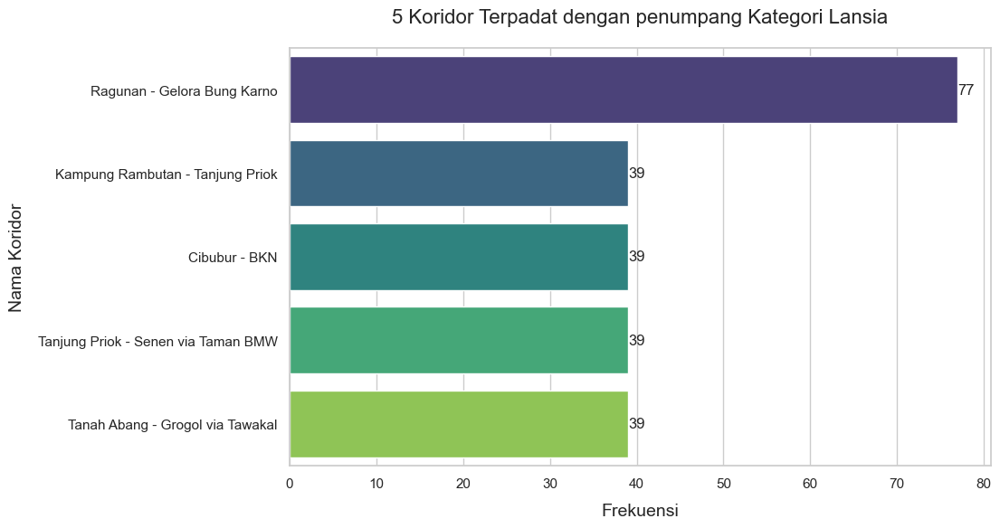

In [235]:
# Membuat grafik koridor terpadat yang sering digunakan penumpang pKategori usia Lansia

plt.figure(figsize=(10,6))
plot = sns.barplot(data=df_lansia_koridor, y='corridorName', x='count', palette='viridis')
plot.bar_label(plot.containers[0],label_type='edge')
plt.title('5 Koridor Terpadat dengan penumpang Kategori Lansia', size=16, pad=20)
plt.xlabel('Frekuensi', size =14, labelpad = 10)
plt.ylabel('Nama Koridor', size =14, labelpad = 10)
plt.show()

**Insight**

- Berdasarkan grafik, penumpang lansia banyak menggunakan transjakarta pada koridor Ragunan-Glora Bung Karno. Dengan demikian, berdasarkan evaluasi pada periode April 2023 ini, kelima koridor tersebut perlu diprioritaskan apabila ada rencana perbaikan pada halte maupun armada dalam koridor tersebut yang lebih ramah untuk digunakan penumpang lansia.
- Peningkatan fasilitas untuk penumpang lansia ini bukan hanya sebatas pada aksestabilitas halte, namun mencangkup pelayanan informasi trayek, fasilitas kursi prioritas didalam bus, dll. Oleh karena itu analisis berdasarkan penggunaan koridor dirasa lebih tepat. 


In [236]:
import folium
from folium.plugins import HeatMap

koordinat_tapIn = df[['tapInStopsLat','tapInStopsLon']].dropna()

peta = folium.Map(location=[df["tapInStopsLat"].max(),df["tapInStopsLon"].min()],zoom_start=11)
HeatMap(data=koordinat_tapIn,radius=16, min_opacity=0.1).add_to(peta)
peta

In [237]:
koordinat_tapOut = df[['tapOutStopsLat','tapOutStopsLon']].dropna()

peta2 = folium.Map(location=[df["tapOutStopsLat"].max(),df["tapOutStopsLon"].min()],zoom_start=11)
HeatMap(data=koordinat_tapOut,radius=16, min_opacity=0.1).add_to(peta2)
peta2

**Insight**

- Dengan melihat peta folium diatas yaitu melalui Koordinat Longtitude dan Latitude pada TapIn dan TapOut dapat diketahui bahwa wilayah penggunaan Transjakarta banyak berpusat pada daerah jakarta pusat dan jakarta selatan. Dapat diamati lebih lanjut ada sedikit pergeseran wilayah (heat location) antara lokasi TapIn dan TapOut. Pada folium pertama terlihat lebih menyebar di sekitar wilayah jakarta timur, pusat, selatan dan utara. Ini menandakan bahwa banyak penumpang yang memulai perjalanan titik awal (tapInn) pada daerah tersebut. Sedangkan pada folium kedua (tapOut) heat locationnya lebih berpusat kearah tengah di wilayah jakarta pusat dan selatan. Ini menandakan bahwa banyak pengguna transjakarta yang bertujuan ke wilayah jakarta pusat dan selatan.
- Berdasarkan peta folium tersebut, titik lokasi transjakarta yang banyak digunakan adalah berada pada wilayah jakarta selatan dan pusat. Hal tersebut dikarenakan wilayah Jakarta pusat dan selatan adalah wilayah perkantoran dan merupakan wilayah yang sibuk. Pengguna transjakarta yang didominasi oleh orang dewasa yang berkerja di kantor pemerintahan maupun perkantoran swasta sangat mungkin menggunakan transjakarta sebagai transportasi untuk bekerja.
- Sedangkan lokasi koordinat TapIn juga berada di daerah sekitar Jakarta Timur, pusat, selatan dan utara kemungkinan pengguna Transjakarta memulai perjalanan di daerah Jakarta Timur,pusat,selatan dan utara sebagai daerah domisili pengguna Transjakarta.

## **Kesimpulan Dan Rekomendasi**
---

## Kesimpulan

Dari analisa insight yang telah dilakukan, kita bisa menjawab permasalahan :
1. **Bagimana Karakteristik Perilaku Pengguna Transjakarta**
    - Distribusi Kartu Bank yang digunakan Penumpang Transjakarta yaitu mayoritas dari total pengguna Transjakarta menggunakan kartu uang elektronik dari Bank DKI kemudian dibawahnya ada E-Money,Brizzi, flazz, online, dan bni
    - Kita dapat memperoleh kisaran Total Revenue / pendapatan yg diperoleh untuk tiap-tiap Provider Payment Card pada periode tersebut April 2023 yaitu yang terbesar didapatkan dari Bank DKI.
    - Distribusi Kelompok Usia Penumpang Transjakarta yaitu mayoritas pengguna Transjakarta berada pada kategori usia Dewasa (18-60 tahun). Dengan sebaran Range usia "31-40" tahun memiliki proporsi terbesar, lalu diikuti oleh range Usia "21-30" dan range usia "41-50"
    - Jenis Kelamin Pengguna Transjakarta dengan proporsi penumpang wanita lebih banyak sejumlah 53.3 % dibandingkan pria sebesar 46.7%

-----

2. **Jenis Transjakarta yang Digunakan Oleh Pengguna Kartu DKI**
    - Kita dapat mengetahui bahwa Transtype yang paling banyak digunakan oleh penumpamg adalah jenis Regular Transjakarta kemudian jenis jakLingko, dan yang terkecil yaitu RoyalTrans. Dan dapat diketahui pula jenis armada Regular Transjakarta merupakan jenis TransType yang paling banyak digunakan untuk perjalanan dari kategori umur Dewasa yang paling banyak menggunakan kartu dki

-----

3. **Pola Perjalanan Transjakarta Secara Umum**
    - Dari segi jam dengan tapIn (keberangkatan) dan tapOut (kedatangan) tertinggi, Koridor Cibubur - Balai Kota merupakan koridor yang paling banyak digunakan.
    Koridor lain seperti Ciputat - CSW, Pulogadung - Monas, dan Harmoni - Jakarta international Stadium. Hal tersebut erat kaitan nya dengan koridor ini merupakan akses ke wilayah perkantoran di jakarta. Koridor terpadat lainnya juga masih melintas disekitar wilayah jakarta pusat dan selatan
    - Koridor yang sering digunakan pada waktu sibuk adalah Koridor yang memilik volume penggunaan tertinggi saat puncak jam sibuk terdapat di **jam 5 sampai jam 6** di pagi hari dan **jam 16 sampai jam 17** di sore hari. Dapat disimpulkan Jam sibuk Transjakarta terjadi saat Pengguna memulai beraktifitas berangkat kerja yakni sekitar pukul **5-6 pagi** dan saat jam pulang kantor yakni pukul **16 sampai 17**.
    - Koridor yang sering digunakan saat jam sibuk pagi adalah Koridor Cibubur - Balai Kota merupakan koridor yang paling banyak digunakan. Koridor lain seperti Ciputat - CSW. Beberapa koridor lain memiliki volume pengguna yang lebih rendah. Koridor yang memiliki volume penggunaan tertinggi tersebut adalah koridor yang melayani rute daerah Jakarta Pusat dan Jakarta Selatan, dimana daerah tersebut merupakan daerah perkantoran dan pusat bisnis Jakarta.
    - Koridor yang sering digunakan saat jam sibuk sore adalah Koridor terpadat saat jam Sibuk sore hari adalah Cibubur - Balai Kota, Harmoni - Jakarta International Stadium, Kebayoran Lama - Tanah Abang. Koridor tersebut adalah koridor yang melayani rute daerah Jakarta Pusat dan Jakarta Selatan, dimana daerah tersebut merupakan daerah perkantoran dan pusat bisnis Jakarta. sehingga tidak heran jika koridor-koridor tersebut adalah koridor terpadat atau terdapat saat jam sibuk pagi hari maupun jam sibuk sore
    - Halte Keberangkatan yang sering digunakan saat jam sibuk pagi adalah Garuda Taman Mini, Penjaringan dan Halte BKN.
    - Halte Keberangkatan yang sering digunakan saat jam sibuk sore adalh Halte BKN  memiliki aktivitas tap out yang hampir sama di pagi hari dan sore hari. Hal ini dapat menandakan bahwa halte tersebut berada di lokasi yang strategis, di mana banyak orang datang di pagi hari maupun sore hari.
    - Halte Kedatangan yang sering digunakan saat jam sibuk pagi dan sore adalah Penjaringan dan BKN

-----

4. **Penggunaan Transjakarta pada akhir pekan selama bulan April 2023**
    - Pada akhir pekan trend jumlah penumpang cenderung mengalami penurunan yang signifikan (karean tidak adanya kegitan perkantoran pemerintahan maupun swasta) dapat diketahui bahwa Jam sibuk penggunaan halte di hari libur termasuk akhir pekan memiliki pesebaran yang merata/ tidak ada perbedaan yang menonjol
    - Koridor yang sering digunakan pada akhir pekan adalah koridor Pinang Ranti - kampung rambutan, JIS- Terminal Muara angke, Pinang Ranti-Bunderan Senayan. Dengan melihat rute dari tiap2 koridor diketahui bahwa Koridor Pinang Ranti - kampung rambutan, koridor ini melewati daerah tempat wisata TMII (taman mini) di dua pintu, dan juga melalui beberapa wilayah pusat kota lainnya. Koridor JIS- Terminal Muara angke melalui pusat kota dan pusat perbelanjaan seperti baywalk, jembatan merah,mangga dua, stasiun jakarta kota, dan juga melewati daerah kota tua Jakarta yang memang banyak dikunjungi sebagai tempat wisata akhir pekan. Koridor Pinang Ranti-Bunderan Senayan melalui tempat wisata seperti TMII, Tebet Eco park, dan glora bung karno.

------

5. **Penggunaan Transjakarta pada Hari Libur Lebaran 2023**
    
    Dapat diamati bahwa koridor-koridor yang mengakses wilayah terminal seperti kampung melayu, kampung rambutan, terminal pulo-gadung stasiun tebet, pulo gebang, kebayoran lama, lebak bulus, Blok M, Kalideres dan tanjung priok memiliki volume penggunaan yang tinggi selama libur Lebaran April 2023 . Hal tersebut kemungkinan disebabkan karena banyak orang menggunakan transjakarta untuk bisa sampai ke terminal-terminal tersebut. Sehingga di waktu lebaran masyarakat banyak menggunakan transjakarta alat transportasi menuju ke terminal bus

----
6. **Pola Perjalanan Berdasarkan Profil Penumpang**
    - Koridor yang sering digunakan berdasarkan gender penumpang khususnya Wanita yaitu penumpang perempuan banyak menggunakan transjakarta diantaranya pada koridor Pasar Minggu - Tanah Abang, Poris Plawad - Bundaran Senayan dan Rusun Rawa Bebek - Kodamar
    - Koridor yang sering digunakan kategori usia lansia yaitu penumpang lansia banyak menggunakan transjakarta pada koridor Ragunan-Glora Bung Karno.



## Rekomendasi

Berdasarkan kesimpulan diatas, diberikan rekomendasi sebagai berikut :

1. Dapat diketahui bahawa Bank DKI memperoleh Revenue /pendapatn terbesar, sehingga Bank DKI dapat terus mempertahankan serta meningkatkan promosi terhadap pengguna transajakarta, khususnya bagi pengguna yang berusia kelompok usia dewasa agar pengguna transjarata tetap loyal untuk menggunakan Kartu Bank DKI. Untuk provider kartu Bank Lain, diperlukan peningkatan promosi yang tertuju pada pengguna layanan transjakarta, seperti promosi diskon, promosi iklan di Halte-halte yang ramai pengguna, serta kegiatan event sales di halte-halte tanpa mengganggu perjalanan pengguna Transjakarta.

----------
2. Meskipun pengguna transjakarta didominasi oleh penumpang dengan kategori usia Dewasa dan remaja, namun Layanan transportasi Transjakarta juga harus tetap ramah terhadap lansia, anak-anak dan orang berkebutuhan khusus. Oleh karena itu, walapun jumlah penumpang dengan kategori lansia tidak banyak, namun tingkat urgensinya sangat tinggi dan untuk memenuhi kebijakan transportasi tersebut, evaluasi terhadap penggunaan transjakarta berdasarka kategori usia perlu di analisis lebih lanjut untuk meningkatan mutu pelayanan Transjakarta yang ramah terhadap Lansia, wanita, anak-anak, dan penumpang disabilitas.
    - Menyediakan fasilitas yang lebih ramah lansia di halte-halte, seperti tempat duduk prioritas dan informasi yang lebih mudah dibaca.
    - Mengadakan kampanye edukasi melalui siaran dalam halte dan Bus untuk penumpang agar memberikan prioritas kepada lansia dalam menggunakan fasilitas dan kursi prioritas.
    - Memodifikasi armada dengan tempat duduk prioritas yang lebih banyak pada trayek yang banyak digunakan lanisa.
    - Meempermudah akses halte-halte yang sulit diakses oleh Lansia
    - Rekomendasi diatas baiknya diprioritaskan pada koridor Ragunan-Glora Bung Karno, Kampung Rambutan - Tanjung Priok, dan Cibubur-BKN. yang memiliki kaitan erat dengan demografi pengguna Lansia pada koridor tersebut

-----------
3.	Penyediaan Fasilitas Khusus Wanita dengan Memperluas layanan bus khusus wanita pada koridor-koridor yang banyak digunakan oleh penumpang Wanita namun belum terfasilitasi dengan baik Seperti coridor Pasar Minggu - Tanah Abang, Poris Plawad - Bundaran Senayan, dan Rusun Rawa Bebek – Kodamar. Dan menambah kursi dan fasilitas prioritas khusus wanita, seperti tempat duduk untuk ibu hamil apabila belom ada penambahan armada khusus wanita pada koridor-koridor tersebut.

-------------
   
4.	Pengoptimalan Armada dan Fasilitas pada Koridor Sibuk untuk meningkatkan layanan dan mutu Transjakarta dapat dilakukan dengan :
    - Melakukan peningkatan armada pada koridor yang padat seperti koridor Cibubur-Balai Kota, Ciputat - CSW, dan Harmoni - Jakarta International Stadium untuk mengatasi kepadatan pada jam sibuk.
    - Peningkatan armada dapat dilakukan dengan mengalihkan bus yang beroperasi dikoridor yang tidak padat ke koridor yang padat.
    - Memastikan ketersediaan armada sesuai dengan jumlah penumpang pada puncak waktujam sibuk yaitu di jam berngakat kerja dan sore hari di jam pulang kerja.

----------------------------
5.	Penyesuaian dan pengaturan Jam Operasional armada
    - Mempertimbangkan penyesuaian yaitu panambahan jam operasional armada pada jam sibuk untuk menjaga kualitas pelayanan dan mencegah penumpukan penumpang karena kurangnya armada.

------------------------
6.	Peningkatan Fasilitas dan Penataan Halte
    - Melakukan perbaikan dan perluasan pada halte-halte padat penumpang, terutama pada titik lokasi garuda taman-mini, rusun muara-kapuk, penjaringan, rawa-selatan, dan cibubur junction.
    - Memperbaiki aksesibilitas dan kenyamanan di halte-halte yang masih mengalami keluhan dari penumpang khususnya di halte-halte yang memiliki tingkat volume penumpang yang tinggi.

-------------------------
7.	Penggunaan Armada pada Akhir Pekan dan Hari Libur sebaiknya difokuskan ke koridor yang memiliki tingkat volume penggunaan tinggi yaitu
Mengalokasikan armada di daerah yang tinggi volume penumpang saat akhir pekan seperti pusat kota, pusat belanja, dan tempat wisata yang mana dalam data ini dilalui oleh trayek Pinang Ranti - kampung rambutan, JIS- Terminal Muara angke, Pinang Ranti-Bunderan Senayan.

----------------------
8.  Dengan mempertimbangkan data penumpang pada musim Lebaran April 2023, Khusus untuk hari libur lebaran diperlukan pengalihan bus yang dapat difokuskan pada koridor yang memiliki tujuan ke terminal seperti, terminal, seperti kampung melayu, kampung rambutan, dan pulo gadung karena berdasarkan data, banyak penumpang yang mengakses daerah tersebut.
 